<a href="https://colab.research.google.com/github/ssinghvishal/Bike-sharing-ML-project-Submission/blob/main/Bike_sharing_ML_project_Submission_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name**    - **Bike Sharing Demand Prediction**



**Project Type - Regression**

**Contribution - Individual**

# **Project Summary -**

This project aims to enhance the mobility and convenience of the public through bike-sharing programs in metropolitan areas. One of the main challenges is maintaining a consistent supply of bikes for rental. Bike-sharing systems are automated and enable people to rent and return bikes at various locations. The project focuses on utilizing historical data on factors such as temperature and time to predict the demand for the bike-sharing program in Seoul.


* There were approximately 8760 records and 14 attributes in the dataset.
* We started by importing the dataset, and necessary libraries and conducted exploratory data analysis (EDA).
* Outliers and null values were removed from the raw data and treated. Data were transformed to ensure that it was compatible with machine learning models.
* We handled target class imbalance using square root normalization.
* Then finally cleaned and scaled data was sent to 11 various models, the metrics were made to evaluate the model, and we tuned the hyperparameters to make sure the right parameters were being passed to the model.
* When developing a machine learning model, it is generally recommended to track multiple metrics because each one highlights distinct aspects of model performance. We are, focusing more on the R2 score and RMSE score.
* The R2 score is scale-independent, which means that it can be used to compare models that are fit to different target variables or to target variables that have different units of measurement. This is particularly useful when comparing models for different problems, as it allows for a direct comparison of the performance of the models, regardless of the scale of the target variable

# **GitHub Link -**

Provide your GitHub Link here.

# **Index**



1.  Problem Statement
2. Know Your Data
3. Understanding Your Variables
4. EDA
5. Data Cleaning
6. Feature Engineering
7. Model Building
8. Model Implementaion.
9. Conclusion



# **Problem Statement**


As urban areas increasingly adopt bike-sharing systems as a sustainable transportation alternative, effective management of bike fleets and station allocations becomes crucial. However, accurately predicting the demand for bike-sharing services poses significant challenges due to the dynamic nature of urban environments and varying factors influencing bike usage.

The problem is to develop a robust predictive model that can accurately forecast bike-sharing demand at different times and locations within a city. This involves analyzing historical data, such as trip patterns, weather conditions, and temporal factors, to predict future demand with high accuracy. The goal is to enable bike-sharing operators to optimize fleet distribution, improve station management, and enhance overall service efficiency.

# **Business Context**






Estimating the number of required bikes at any given time and day is a critical business concern. Having fewer bikes results in resource wastage (in terms of bike maintenance and the land/bike stand required for parking and security), while having more bikes can lead to revenue loss, ranging from immediate loss due to a lower number of customers to potential long-term loss due to a loss of future customers. Therefore, it is essential for bike rental businesses to have an estimate of demand to function effectively.

# **General Guidelines** : -  

1.   Well-structured, formatted, and commented code is required.
2.   Exception Handling, Production Grade Code & Deployment Ready Code will be a plus. Those students will be awarded some additional credits.
     
     The additional credits will have advantages over other students during Star Student selection.
       
             [ Note: - Deployment Ready Code is defined as, the whole .ipynb notebook should be executable in one go
                       without a single error logged. ]

3.   Each and every logic should have proper comments.
4. You may add as many number of charts you want. Make Sure for each and every chart the following format should be answered.
        

```
# Chart visualization code
```
            

*   Why did you pick the specific chart?
*   What is/are the insight(s) found from the chart?
* Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

5. You have to create at least 15 logical & meaningful charts having important insights.


[ Hints : - Do the Vizualization in  a structured way while following "UBM" Rule.

U - Univariate Analysis,

B - Bivariate Analysis (Numerical - Categorical, Numerical - Numerical, Categorical - Categorical)

M - Multivariate Analysis
 ]





6. You may add more ml algorithms for model creation. Make sure for each and every algorithm, the following format should be answered.


*   Explain the ML Model used and it's performance using Evaluation metric Score Chart.


*   Cross- Validation & Hyperparameter Tuning

*   Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

*   Explain each evaluation metric's indication towards business and the business impact pf the ML model used.




















# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [159]:
# Import Libraries
# libraries that are used for analysis and visualization
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

# to import datetime library
from datetime import datetime
import datetime as dt

# libraries used to pre-process
from sklearn import preprocessing, linear_model
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split

# libraries used to implement models
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor, GradientBoostingRegressor, AdaBoostRegressor
from sklearn.svm import SVR
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

# libraries to evaluate performance
from sklearn import metrics
from sklearn.metrics import mean_squared_error, r2_score, accuracy_score, mean_absolute_error

# Library of warnings would assist in ignoring warnings issued
import warnings
warnings.filterwarnings('ignore')

# to set max column display
pd.pandas.set_option('display.max_columns',None)

### Dataset Loading

In [160]:
# Load Dataset
#Mounting the drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [222]:
# load the Seol bike data set from the drive
bike_df = pd.read_csv('/content/SeoulBikeData.csv',encoding='unicode_escape')

### Dataset First View

In [223]:
# Dataset First Look

# Viewing the top 5 rows to take a glimpse of the data
bike_df.head()

,Date,Rented Bike Count,Hour,Temperature(°C),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(°C),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01/12/2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,01/12/2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,01/12/2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,01/12/2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,01/12/2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes


### Dataset Rows & Columns count

In [224]:
# Dataset Rows & Columns count

bike_df.shape


(8760, 14)

In [164]:

print(f'number of rows : {bike_df.shape[0]}  \nnumber of columns : {bike_df.shape[1]}')

number of rows : 8760  
number of columns : 14


### Dataset Information

In [165]:
# Dataset Info

bike_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Date                       8760 non-null   object 
 1   Rented Bike Count          8760 non-null   int64  
 2   Hour                       8760 non-null   int64  
 3   Temperature(°C)            8760 non-null   float64
 4   Humidity(%)                8760 non-null   int64  
 5   Wind speed (m/s)           8760 non-null   float64
 6   Visibility (10m)           8760 non-null   int64  
 7   Dew point temperature(°C)  8760 non-null   float64
 8   Solar Radiation (MJ/m2)    8760 non-null   float64
 9   Rainfall(mm)               8760 non-null   float64
 10  Snowfall (cm)              8760 non-null   float64
 11  Seasons                    8760 non-null   object 
 12  Holiday                    8760 non-null   object 
 13  Functioning Day            8760 non-null   objec

* We have 14 columns. most of them are numerical except Seasons, Holiday, Functioning Days, and Date

* We have to convert the Date column into the DateTime datatype.

#### Duplicate Values

**How important is it to get rid of duplicate records in my data?**

* When there are identical instances in a dataset, it is referred to as "duplication." Such duplication could occur due to erroneous data entry or data collection procedures. Eliminating duplicate data from the dataset saves time and money by avoiding the repetition of the same data sent to the machine learning model.

In [166]:
# Dataset Duplicate Value Count
# Checking Duplicate Values
value = len(bike_df[bike_df.duplicated()])
print("The number of duplicate values in the data set is = ",value)

The number of duplicate values in the data set is =  0


We found that there is no duplicate entry in the above data.

#### Missing Values/Null Values

**Why dealing with missing values is necessary?**

Real-world data often contains numerous missing values, which can be due to data corruption or other factors. As many machine-learning algorithms do not support missing values, it is necessary to handle them during the dataset pre-processing stage. Thus, the first step in dealing with missing data is to identify the missing values.

In [13]:
# Missing Values/Null Values Count
print(bike_df.isnull().sum())


Date                         0
Rented Bike Count            0
Hour                         0
Temperature(°C)              0
Humidity(%)                  0
Wind speed (m/s)             0
Visibility (10m)             0
Dew point temperature(°C)    0
Solar Radiation (MJ/m2)      0
Rainfall(mm)                 0
Snowfall (cm)                0
Seasons                      0
Holiday                      0
Functioning Day              0
dtype: int64


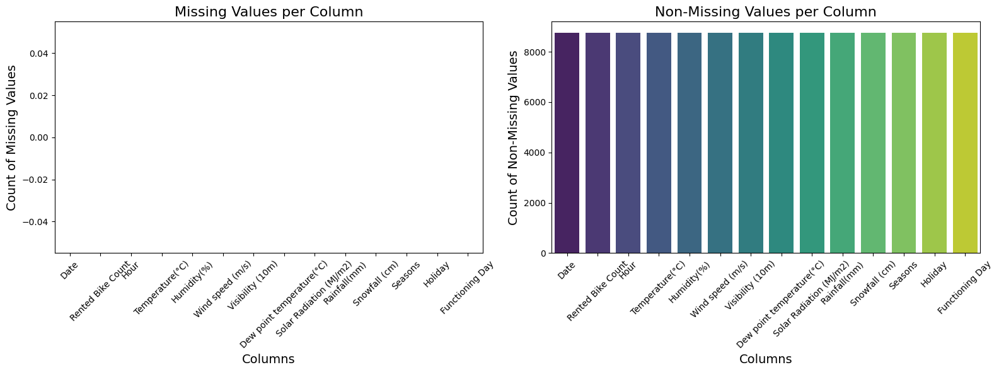

In [24]:
# Visualizing the missing values
missing_values = bike_df.isnull().sum()
non_missing_values = bike_df.notnull().sum()

# Create a DataFrame for easier plotting
missing_data = pd.DataFrame({
    'Columns': missing_values.index,
    'Missing Values': missing_values.values,
    'Non-Missing Values': non_missing_values.values
})

# Sort the DataFrame by the number of missing values
missing_data.sort_values(by='Missing Values', ascending=False, inplace=True)

# Create the subplots
plt.figure(figsize=(16, 6))

# Plot for Missing Values
plt.subplot(1, 2, 1)
sns.barplot(x='Columns', y='Missing Values', data=missing_data, palette='coolwarm')
plt.title('Missing Values per Column', size=16)
plt.xlabel('Columns', size=14)
plt.ylabel('Count of Missing Values', size=14)
plt.xticks(rotation=45)

# Plot for Non-Missing Values
plt.subplot(1, 2, 2)
sns.barplot(x='Columns', y='Non-Missing Values', data=missing_data, palette='viridis')
plt.title('Non-Missing Values per Column', size=16)
plt.xlabel('Columns', size=14)
plt.ylabel('Count of Non-Missing Values', size=14)
plt.xticks(rotation=45)

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()


From the above command, we noticed that every column has 0 null values. This seems to be clean data and there is no missing data in any of the rows and columns.

### What did you know about your dataset?

The dataset provided contains 14 columns and 8760 rows and does not have any missing or duplicate values.


The goal is to predict the demand for bike-sharing using this dataset, which is sourced from the bike-sharing services market. Demand prediction involves analytical studies on the probability of a customer using bike-sharing services, with the aim of understanding and managing demand and supply equilibrium throughout the day.

## ***2. Understanding Your Variables***

In [225]:
# Dataset Columns


bike_df.columns

Index(['Date', 'Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Seasons',
       'Holiday', 'Functioning Day'],
      dtype='object')

In [26]:
# Dataset Describe
bike_df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Date,8760,365,01/12/2017,24,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Rented Bike Count,8760.0,NaN,NaN,NaN,704.602055,644.997468,0.0,191.0,504.5,1065.25,3556.0
Hour,8760.0,NaN,NaN,NaN,11.5,6.922582,0.0,5.75,11.5,17.25,23.0
Temperature(°C),8760.0,NaN,NaN,NaN,12.882922,11.944825,-17.8,3.5,13.7,22.5,39.4
Humidity(%),8760.0,NaN,NaN,NaN,58.226256,20.362413,0.0,42.0,57.0,74.0,98.0
Wind speed (m/s),8760.0,NaN,NaN,NaN,1.724909,1.0363,0.0,0.9,1.5,2.3,7.4
Visibility (10m),8760.0,NaN,NaN,NaN,1436.825799,608.298712,27.0,940.0,1698.0,2000.0,2000.0
Dew point temperature(°C),8760.0,NaN,NaN,NaN,4.073813,13.060369,-30.6,-4.7,5.1,14.8,27.2
Solar Radiation (MJ/m2),8760.0,NaN,NaN,NaN,0.569111,0.868746,0.0,0.0,0.01,0.93,3.52
Rainfall(mm),8760.0,NaN,NaN,NaN,0.148687,1.128193,0.0,0.0,0.0,0.0,35.0


### Variables Description

The dataset contains weather information (Temperature, Humidity, Windspeed, Visibility, Dewpoint, Solar radiation, Snowfall, Rainfall), the number of bikes rented per hour and date information.

**Attribute Information:**


**Date :**year-month-day

**Rented Bike count :**Count of bikes rented at each hour

**Hour :**Hour of the day

**Temperature :**Temperature in Celsius

**Humidity :**%

**Windspeed :**m/s

**Visibility :**10m

**Dew point temperature :**Celsius

**Solar radiation :**MJ/m2

**Rainfall :**mm

**Snowfall :**cm

**Seasons :**Winter, Spring, Summer, Autumn

**Holiday :**Holiday/No holiday

**Functional Day :**NoFunc(Non Functional Hours), Fun(Functional hours)

### Check Unique Values for each variable.

In [27]:
# Check Unique Values for each variable.
bike_df.nunique()

,0
Date,365
Rented Bike Count,2166
Hour,24
Temperature(°C),546
Humidity(%),90
Wind speed (m/s),65
Visibility (10m),1789
Dew point temperature(°C),556
Solar Radiation (MJ/m2),345
Rainfall(mm),61


# **Observations:**
* We are focusing on several key columns of our dataset, including 'Hour', 'Holiday', 'Functioning Day', 'Rented Bike Count', 'Temperature(°C)', and 'Seasons', as they contain a wealth of information.

* By utilizing these features, we plan to create a regression model and implement various regression algorithms.

* There is a column 'Hour' which might be considered a categorical feature or maybe a numerical feature based on the data we will try both and see the result difference.

## 3. ***Data Wrangling***

### Data Wrangling Code

In [226]:
# Write your code to make your dataset analysis ready.
# Renaming complex columns name for the sake of simplicity    **(Not a necessary step to do)**
bike_df=bike_df.rename(columns={'Rented Bike Count':'rented_bike_count',
                                'Date':'date',
                                'Hour':'hour',
                                'Seasons':'seasons',
                                'Holiday':'holiday',
                                'Temperature(°C)':'temperature',
                                'Humidity(%)':'humidity',
                                'Wind speed (m/s)':'wind_speed',
                                'Visibility (10m)':'visibility',
                                'Dew point temperature(°C)':'dew_point_temperature',
                                'Solar Radiation (MJ/m2)':'solar_radiation',
                                'Rainfall(mm)':'rainfall',
                                'Snowfall (cm)':'snowfall',
                                'Functioning Day':'functioning_day'})

In [249]:
dependent_variable = ['rented_bike_count']

In [227]:
bike_df['date'] = pd.to_datetime(bike_df['date'], dayfirst=True)

# Split the 'date' column into separate columns for day, month, year, and weekday
bike_df['day'] = bike_df['date'].dt.day
bike_df['month'] = bike_df['date'].dt.month
bike_df['year'] = bike_df['date'].dt.year
bike_df['weekday'] = bike_df['date'].dt.day_name()

# Drop the original 'date' column
bike_df.drop('date', axis=1, inplace=True)

In [228]:

bike_df.hour.unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23])

In [33]:
def session(x):

    '''
    For exploratory data analysis (EDA) purposes, the "Hour" column can be converted into categorical variables
    such as "Morning", "Noon", and "Night", without altering the existing label encoding format of the "Hour" column.
    This conversion is not necessary for model training.
    '''

    if x>4 and x<=8:
        return 'Early Morning'
    elif x>8 and x<=12:
        return 'Morning'
    elif x>12 and x<=16:
        return 'Afternoon'
    elif x>16 and x<=20:
        return 'Evening'
    elif x>20 and x<=24:
        return 'Night'
    elif x<=4:
        return 'Late Night'

#apply funtion to make new category column
bike_df['session'] = bike_df['hour'].apply(session)

In [34]:
print(f'Min Count: {bike_df.rented_bike_count.min()}')
print(f'Max Count: {bike_df.rented_bike_count.max()}')

Min Count: 0
Max Count: 3556


### What all manipulations have you done and insights you found?

The hours of the day follow a clear sequence, with 9 am being closer to 10 am than it is to 8 am, and farther from 6 pm. This feature can be classified as a discrete ordinal variable. We will consider the hour as a categorical value and transform it into a numerical value to see if there is any difference in the results.

## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

#### Chart - 1 Column: 'rented_bike_count'

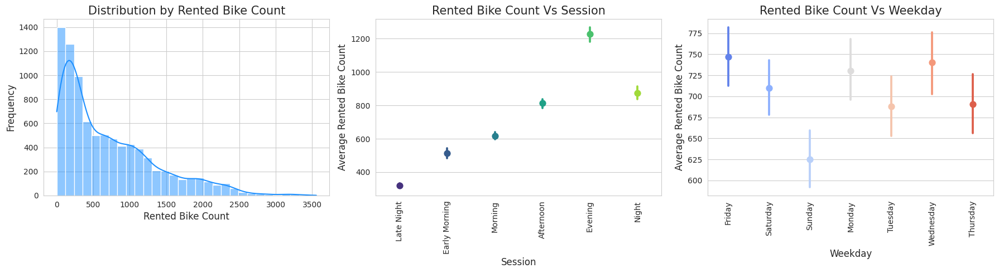

In [35]:
# Chart - 1 visualization code

# Set a modern and aesthetically pleasing style
sns.set_style("whitegrid")

# Create subplots
fig, ax = plt.subplots(1, 3, figsize=(18, 5))

# Distribution analysis with a vibrant color palette
dist = sns.histplot(bike_df['rented_bike_count'], bins=30, kde=True, color='dodgerblue', ax=ax[0])
dist.set_title('Distribution by Rented Bike Count', size=15)
dist.set_xlabel('Rented Bike Count', size=12)
dist.set_ylabel('Frequency', size=12)

# Bi-variate analysis: Rented Bike Count Vs Session with a color palette
point1 = sns.pointplot(data=bike_df, x='session', y='rented_bike_count', ax=ax[1], palette='viridis', markers='o', linestyles='-')
point1.set_title('Rented Bike Count Vs Session', size=15)
point1.set_xlabel('Session', size=12)
point1.set_ylabel('Average Rented Bike Count', size=12)
# Set x-ticks rotation to 90 degrees
point1.set_xticklabels(point1.get_xticklabels(), rotation=90)

# Bi-variate analysis: Rented Bike Count Vs Weekday with a different color palette
point2 = sns.pointplot(data=bike_df, x='weekday', y='rented_bike_count', ax=ax[2], palette='coolwarm', markers='o', linestyles='-')
point2.set_title('Rented Bike Count Vs Weekday', size=15)
point2.set_xlabel('Weekday', size=12)
point2.set_ylabel('Average Rented Bike Count', size=12)
# Set x-ticks rotation to 90 degrees
point2.set_xticklabels(point2.get_xticklabels(), rotation=90)

# Adjust layout to prevent overlap and make the chart look better
plt.tight_layout()

# Show the plot
plt.show()


##### 1. Why did you pick the specific chart?


I picked the specific charts to analyze the distribution of bike rentals, which helps identify common rental ranges; bivariate relationships with session and weekday to understand usage patterns; and to visualize trends across different times and days. These insights collectively reveal how rental patterns vary and inform operational and marketing strategies.

##### 2. What is/are the insight(s) found from the chart?

**Peak Times:** Understanding peak rental times and days helps in optimizing bike availability and maintenance schedules.

**Targeted Promotions:** If specific days or sessions have lower rentals, targeted promotions could be implemented to boost usage during these times.

**Resource Allocation:** These patterns can guide the allocation of bikes and resources across different times of the day and week to better match supply with demand.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

**Optimizing Bike Availability:** Identifying peak times and days helps ensure that bike availability aligns with demand, minimizing shortages and improving customer satisfaction.

**Targeted Promotions:** Recognizing periods of low rentals allows for effective promotional campaigns to boost usage during off-peak times, increasing overall revenue.

**Improved Customer Experience:** Tailoring services based on demand patterns enhances the customer experience, leading to higher loyalty and positive reviews.

**Insights that lead to negative growth**-

**Over-Reliance on Peak Times:** Heavy dependence on specific high-demand periods could make the business vulnerable to disruptions, affecting revenue if these peak times are impacted.

**Operational Strain:** High demand during peak times may strain resources and logistics, potentially leading to service issues and customer dissatisfaction.

**Neglect of Off-Peak Opportunities:** Focusing solely on peak periods might result in missed revenue opportunities during off-peak times, leading to stagnation or slower growth.

#### Chart - 2 Column: 'hour'

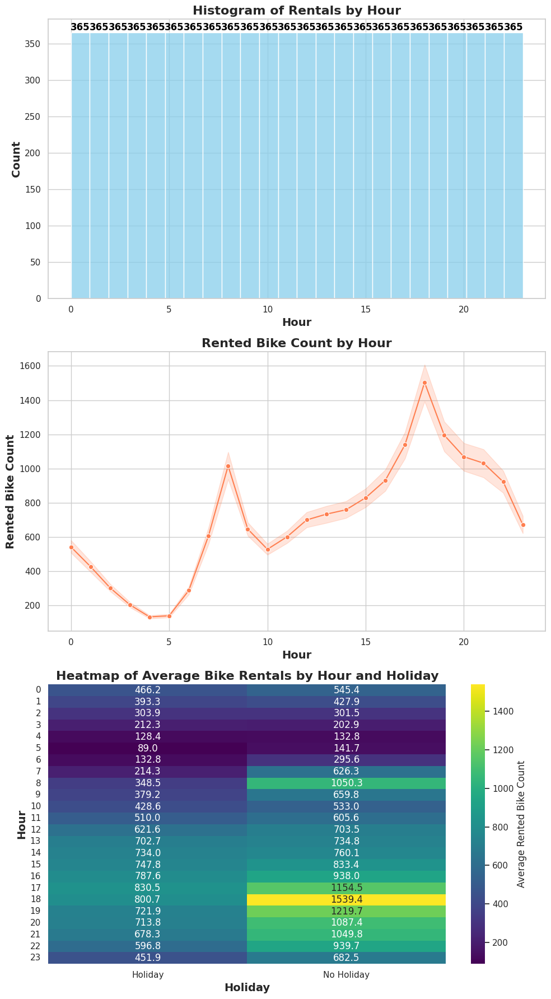

In [39]:


# Set a colorful style
sns.set(style="whitegrid")

# Create subplots with vertical arrangement
fig, ax = plt.subplots(3, 1, figsize=(10, 18))  # Adjusted figure size for vertical layout

# Univariate analysis: Histogram of Rentals by Hour with a vibrant color
sns.histplot(data=bike_df, x='hour', ax=ax[0], color='skyblue', bins=24, kde=False)
ax[0].set_title('Histogram of Rentals by Hour', size=16, fontweight='bold')
ax[0].set_xlabel('Hour', size=14, fontweight='bold')
ax[0].set_ylabel('Count', size=14, fontweight='bold')

# Add value count on top of each bin
for p in ax[0].patches:
    ax[0].annotate(format(p.get_height(), '.0f'),
                   (p.get_x() + p.get_width() / 2., p.get_height()),
                   ha='center', va='bottom', fontsize=12, color='black', fontweight='bold')

# Bi-variate analysis: Line Plot of Rented Bike Count Vs Hour with distinct colors
sns.lineplot(data=bike_df, x='hour', y='rented_bike_count', ax=ax[1], color='coral', marker='o')
ax[1].set_title('Rented Bike Count by Hour', size=16, fontweight='bold')
ax[1].set_xlabel('Hour', size=14, fontweight='bold')
ax[1].set_ylabel('Rented Bike Count', size=14, fontweight='bold')

# Multi-variate analysis: Heatmap of Average Bike Rentals by Hour and Holiday
pivot_table = bike_df.pivot_table(values='rented_bike_count', index='hour', columns='holiday', aggfunc='mean')
sns.heatmap(pivot_table, cmap='viridis', annot=True, fmt='.1f', ax=ax[2], cbar_kws={'label': 'Average Rented Bike Count'})
ax[2].set_title('Heatmap of Average Bike Rentals by Hour and Holiday', size=16, fontweight='bold')
ax[2].set_xlabel('Holiday', size=14, fontweight='bold')
ax[2].set_ylabel('Hour', size=14, fontweight='bold')

plt.tight_layout()
plt.show()


##### 1. Why did you pick the specific chart?

**Histogram of Rentals by Hour:** Chosen to visualize the distribution of bike rentals across different hours, highlighting peak and off-peak times, and to understand how frequently bikes are rented at each hour of the day.

**Line Plot of Rented Bike Count Vs Hour:** Selected to analyze the trend of bike rentals over hours, providing a clear view of how rental counts change throughout the day, which helps in identifying periods of high and low demand.

**Heatmap of Average Bike Rentals by Hour and Holiday:** Picked to explore the interaction between hour of the day and holidays, revealing how bike rentals vary not only by time but also in the context of holiday effects, thus helping in strategic planning for both regular and special periods.

##### 2. What is/are the insight(s) found from the chart?

* Every hour has an equal number of counts in the dataset.
* Demand for rented bike count is higher at 8 AM and 6 PM indicating a high demand during business hours.
* Rented Bike Count follows 2 patterns one for holiday and another for no holiday.
* Holiday: The first pattern is where there is a peak in the rentals at around 8 am and another at around 6 pm. These correspond to local bikers who typically go to work on a working day, Monday to Friday.
* Non-Working Day: Second pattern where there are more or less uniform rentals across the day with a peak at around noon time. These correspond to probable tourists who typically are casual users who rent/drop off bikes uniformly during the day and tour the city on nonworking days which typically are Saturday and Sunday

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

**Optimized Resource Allocation:** Understanding peak rental times allows for better staffing and resource management, ensuring high availability during busy periods.

**Targeted Marketing:** Insights into rental patterns can inform targeted promotions and discounts, especially during off-peak hours or holidays, boosting overall revenue.

**Enhanced Planning:** Analyzing hourly and holiday trends helps in forecasting demand more accurately, leading to improved inventory management and operational efficiency.

**Insights that lead to negative growth**

**Low Demand Hours:** If the analysis reveals consistent low rental counts during certain hours, it may indicate underutilized resources or a need for targeted strategies to boost engagement during these times.

**Holiday Impact:** If rentals drop significantly on certain holidays, it might suggest that holiday promotions or special offers are not effectively attracting customers, potentially leading to lost revenue opportunities.

**Inefficient Allocation:** Identifying hours with high demand but insufficient resources could highlight inefficiencies, potentially leading to customer dissatisfaction and missed revenue if not addressed promptly.








#### Chart - 3 Column: 'temperature'



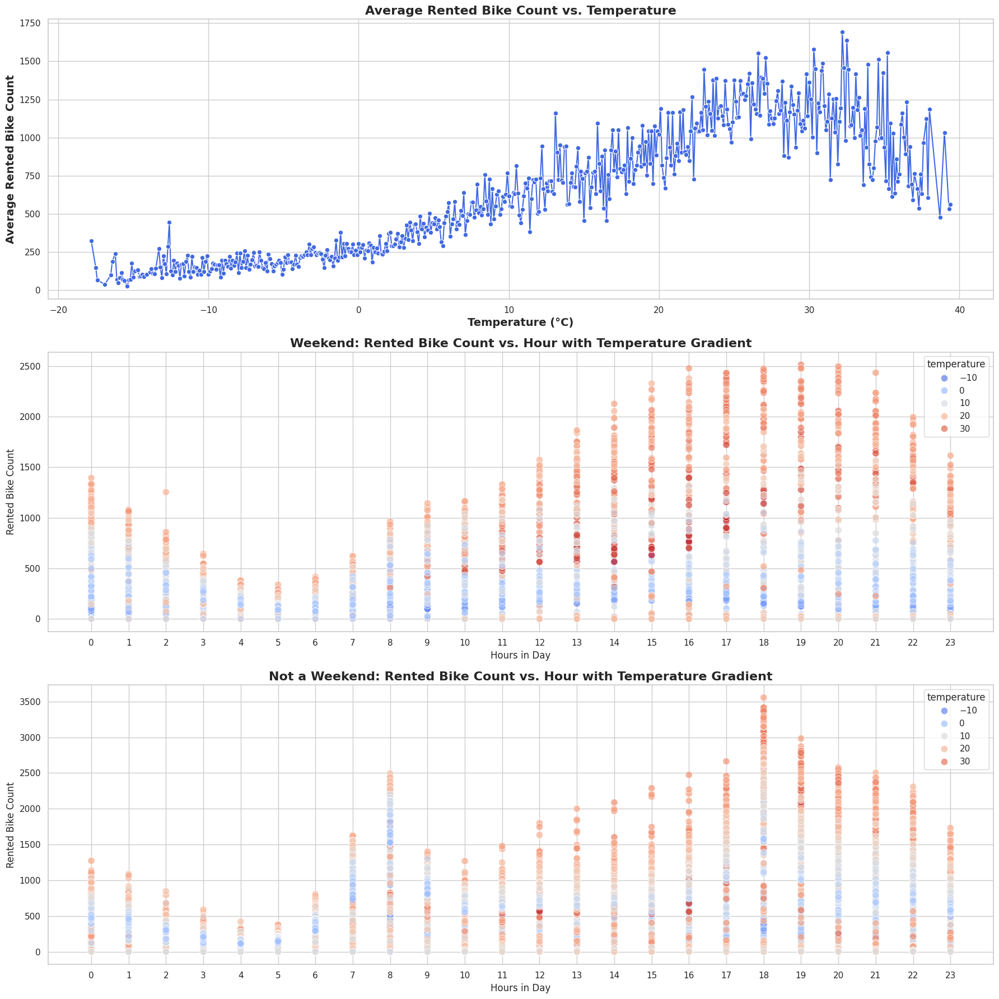

In [43]:
# Chart - 3 visualization code
# Set a colorful and modern style
sns.set(style="whitegrid")

# Create subplots with a larger figure size
fig, ax = plt.subplots(3, 1, figsize=(18, 18))  # Adjusted height for better vertical spacing

# Univariate analysis: Average Rented Bike Count vs. Temperature
temp_wrt_bike_rent_count = bike_df.groupby('temperature')['rented_bike_count'].mean().reset_index()
line = sns.lineplot(x='temperature', y='rented_bike_count', data=temp_wrt_bike_rent_count, ax=ax[0], color='royalblue', marker='o')
line.set_title('Average Rented Bike Count vs. Temperature', size=16, fontweight='bold')
line.set_xlabel('Temperature (°C)', size=14, fontweight='bold')
line.set_ylabel('Average Rented Bike Count', size=14, fontweight='bold')

# Multi-variate analysis: Weekend - Scatter Plot with Temperature Gradient
bike_df_w = bike_df[(bike_df.weekday == 'Saturday') | (bike_df.weekday == 'Sunday')]
scatter2 = sns.scatterplot(x=bike_df_w.hour, y=bike_df_w['rented_bike_count'], hue=bike_df_w.temperature, palette="coolwarm", ax=ax[1], s=80, edgecolor='w', alpha=0.7)
scatter2.set(xticks=range(24), xlabel='Hours in Day', ylabel='Rented Bike Count')
scatter2.set_title('Weekend: Rented Bike Count vs. Hour with Temperature Gradient', size=16, fontweight='bold')

# Multi-variate analysis: Not a Weekend - Scatter Plot with Temperature Gradient
bike_df_nw = bike_df[(bike_df.weekday != 'Saturday') & (bike_df.weekday != 'Sunday')]
scatter = sns.scatterplot(x=bike_df_nw.hour, y=bike_df_nw['rented_bike_count'], hue=bike_df_nw.temperature, palette="coolwarm", ax=ax[2], s=80, edgecolor='w', alpha=0.7)
scatter.set(xticks=range(24), xlabel='Hours in Day', ylabel='Rented Bike Count')
scatter.set_title('Not a Weekend: Rented Bike Count vs. Hour with Temperature Gradient', size=16, fontweight='bold')

plt.tight_layout()
plt.show()


##### 1. Why did you pick the specific chart?

**Line Plot (Average Rented Bike Count vs. Temperature):** Chosen to identify how the average number of rented bikes varies with temperature. This helps in understanding temperature's effect on bike rentals, which can inform decisions on optimal operating conditions and target markets.

**Scatter Plot (Weekend: Rented Bike Count vs. Hour with Temperature Gradient):** Selected to examine how bike rentals on weekends are influenced by the hour of the day and temperature. This analysis reveals patterns and correlations specific to weekends, aiding in targeted promotions and operational adjustments for these peak times.

**Scatter Plot (Not a Weekend: Rented Bike Count vs. Hour with Temperature Gradient):** Chosen to compare how bike rentals on non-weekend days differ by hour and temperature. This helps in understanding weekday rental patterns and making operational decisions based on typical workweek behavior versus weekends.

##### 2. What is/are the insight(s) found from the chart?

* We can see from the line plot above that the average number of bikes rented with temperature increases steadily, with a slight decrease at the highest temperature.
* People prefer renting bikes in warm environments. Therefore, the demand for bicycles is high if the temperature is sufficiently warm, but extremely hot temperatures are also unsuitable for bike demand.
* However, there is a slight decrease in count if the temperature is too high (the darkest of the blue dots).

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

**Positive Business Impact:**

**Optimized Operational Planning:** Insights on how temperature affects bike rentals can help adjust staffing and resource allocation to match demand, leading to improved efficiency and customer satisfaction.

**Targeted Marketing Strategies:** Understanding rental patterns by hour and temperature on weekends and weekdays enables targeted promotions, potentially increasing revenue during low-demand periods.

**Seasonal Adjustments:** Knowledge of rental behavior across different temperatures helps in planning seasonal adjustments, enhancing profitability during varying weather conditions.

**Negative Growth Insights:**

**Low Rentals During Specific Temperatures:** If data shows significant drops in rentals at certain temperatures, it may highlight a need for better strategies or incentives during these conditions to avoid lost revenue.

**Weekend vs. Weekday Discrepancies:** Large disparities in rental counts between weekends and weekdays could indicate missed opportunities for boosting weekday rentals, impacting overall growth.

**Underperforming Hours:** Identifying consistently low rental hours may reveal inefficiencies or a need for targeted interventions to prevent further decline in those time slots.

#### Chart - 4 Column: 'humidity'

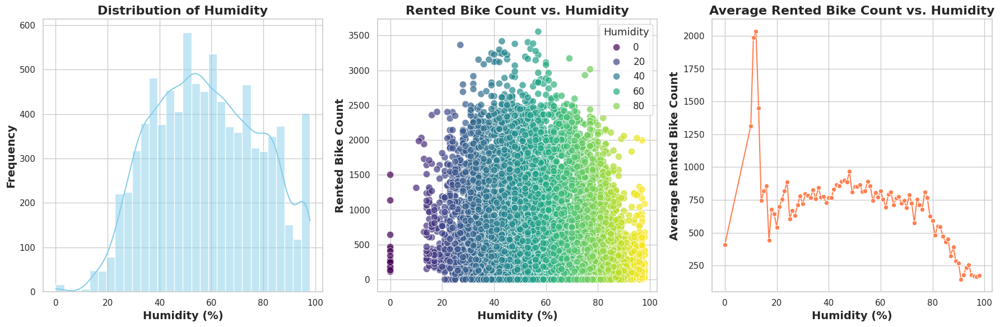

In [44]:
# Chart - 4 visualization code
# Set a modern and colorful style
sns.set(style="whitegrid")

# Create subplots with adjusted figure size
fig, ax = plt.subplots(1, 3, figsize=(18, 6))

# Univariate analysis: Distribution of Humidity
dist = sns.histplot(bike_df.humidity, ax=ax[0], kde=True, color='skyblue', bins=30)
dist.set_title('Distribution of Humidity', size=16, fontweight='bold')
dist.set_xlabel('Humidity (%)', size=14, fontweight='bold')
dist.set_ylabel('Frequency', size=14, fontweight='bold')

# Bi-variate analysis: Rented Bike Count vs. Humidity
scatter = sns.scatterplot(data=bike_df, x='humidity', y='rented_bike_count', ax=ax[1], hue='humidity', palette='viridis', s=80, edgecolor='w', alpha=0.7)
scatter.set_xlabel('Humidity (%)', size=14, fontweight='bold')
scatter.set_ylabel('Rented Bike Count', size=14, fontweight='bold')
scatter.set_title('Rented Bike Count vs. Humidity', size=16, fontweight='bold')
scatter.legend(title='Humidity', title_fontsize='13', fontsize='12')

# Line Plot: Average Rented Bike Count vs. Humidity
group_humidity = bike_df.groupby('humidity')['rented_bike_count'].mean().reset_index()
line = sns.lineplot(data=group_humidity, x='humidity', y='rented_bike_count', ax=ax[2], color='coral', marker='o')
line.set_xlabel('Humidity (%)', size=14, fontweight='bold')
line.set_ylabel('Average Rented Bike Count', size=14, fontweight='bold')
line.set_title('Average Rented Bike Count vs. Humidity', size=16, fontweight='bold')

plt.tight_layout()
plt.show()


##### 1. Why did you pick the specific chart?

**Distribution Plot of Humidity:** Chosen to visualize the spread and distribution of humidity values in the dataset. This helps identify the range and frequency of different humidity levels, providing a baseline understanding of how humidity varies.

**Scatter Plot (Rented Bike Count vs. Humidity):** Selected to explore the relationship between humidity and bike rentals. This chart helps identify any correlation or trends between the two variables, revealing how changes in humidity might affect rental activity.

**Line Plot (Average Rented Bike Count vs. Humidity):** Used to show how the average number of rented bikes changes with different humidity levels. This plot is useful for understanding overall trends and patterns, helping to gauge the impact of humidity on rental behavior across the dataset.

##### 2. What is/are the insight(s) found from the chart?

We can see from the plots above that the average number of bikes rented goes up and down sharply with the peak at around 50. For the number of rented bikes in demand, the most preferred humid environment is 20-90.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

**Positive Business Impact:**

**Optimized Operations:** Understanding how humidity affects bike rentals allows for better planning and adjustment of resources based on weather conditions, potentially boosting rental efficiency.

**Negative Growth Insights:**

**Low Rentals in High Humidity:** If high humidity correlates with lower rentals, it highlights a need for strategies to counteract adverse weather effects, avoiding revenue loss during such conditions.

#### Chart - 5

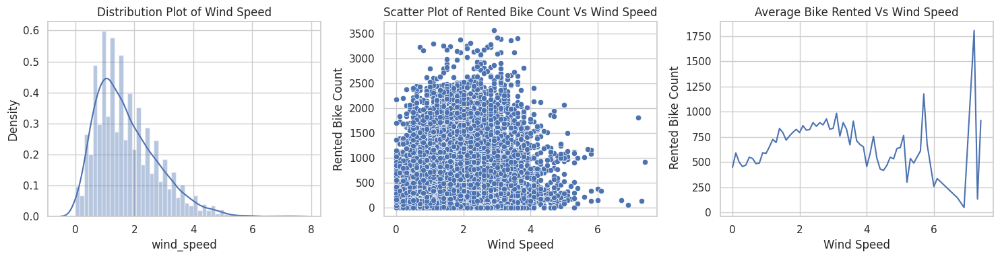

In [49]:
# Chart - 5 visualization code

fig,ax = plt.subplots(1,3, figsize=(15,4))

# Univariate analysis
dist = sns.distplot(bike_df.wind_speed, ax = ax[0])
dist.set_title('Distribution Plot of Wind Speed')

# Bi-variate analysis
# Rented Bike Count Vs Wind Speed
scatter = sns.scatterplot(data=bike_df, x='wind_speed', y='rented_bike_count', ax = ax[1])
scatter.set(xlabel='Wind Speed', ylabel='Rented Bike Count', title='Scatter Plot of Rented Bike Count Vs Wind Speed')

# Line Plot
group_wind_speed = bike_df.groupby(['wind_speed'])['rented_bike_count'].mean().reset_index()
line = sns.lineplot(data=group_wind_speed, x='wind_speed', y = 'rented_bike_count', ax= ax[2])
line.set(xlabel='Wind Speed', ylabel = ' Rented Bike Count', title='Average Bike Rented Vs Wind Speed')

plt.tight_layout()
plt.show()



##### 1. Why did you pick the specific chart?



I picked these charts to provide a comprehensive analysis of wind speed and bike rentals:

**Distribution Plot:** To understand the frequency and range of wind speeds in the dataset.

**Scatter Plot:** To explore the relationship between wind speed and rented bike count, identifying any direct correlations.

**Line Plot:** To reveal trends in average bike rentals across different wind speeds, highlighting how wind speed influences rental behavior.



##### 2. What is/are the insight(s) found from the chart?

* We can see from the distribution plot that wind speed is slightly positively skewed.
* Scatter Plot tells us about the distribution of the wind speed and rented bike count, and how the values of the two variables are related to each other.
* Line plot tells us that people prefer moderate wind but there is a spike at wind speed 7.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

**Positive Impact:**

Understanding the impact of wind speed on bike rentals helps in optimizing bike availability and scheduling based on weather conditions. If high wind speeds significantly reduce rentals, bike-sharing services can proactively adjust operations or promote usage during calmer periods.

**Negative Impact:**

If data shows that higher wind speeds consistently lead to lower bike rentals, it suggests that poor weather conditions deter users. This could mean revenue losses during windy conditions, necessitating strategies to mitigate the impact or increase awareness about bike availability regardless of weather.

#### Chart - 6 Column: 'visibility'

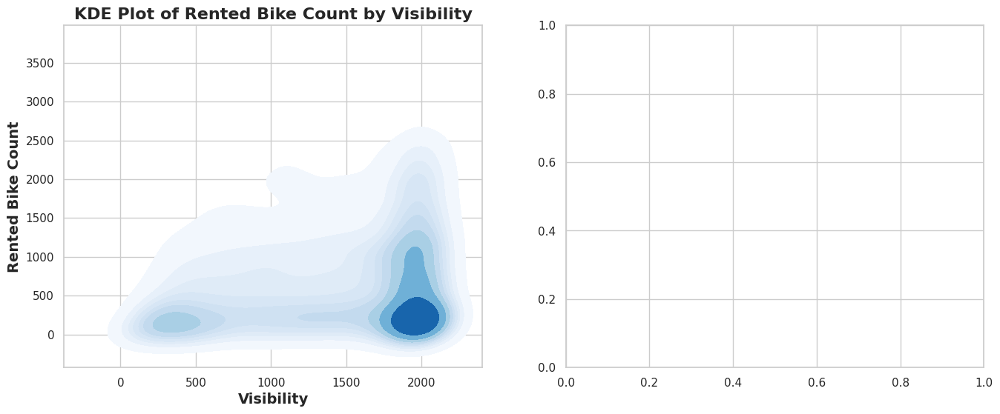

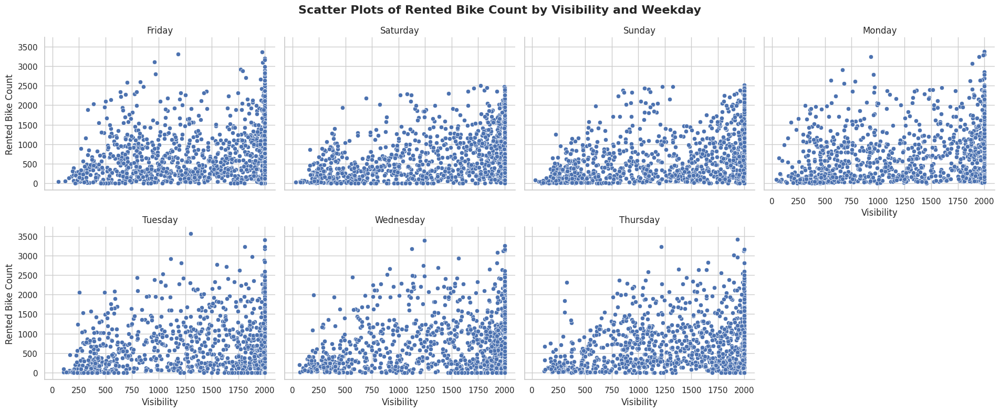

In [52]:
# Chart - 6 visualization code

# Create subplots with adjusted figure size
fig, ax = plt.subplots(1, 2, figsize=(16, 6))

# KDE Plot: Density of Rented Bike Count by Visibility
kde_plot = sns.kdeplot(data=bike_df, x='visibility', y='rented_bike_count', fill=True, cmap='Blues', ax=ax[0])
kde_plot.set_title('KDE Plot of Rented Bike Count by Visibility', size=16, fontweight='bold')
kde_plot.set_xlabel('Visibility', size=14, fontweight='bold')
kde_plot.set_ylabel('Rented Bike Count', size=14, fontweight='bold')

# FacetGrid: Scatter Plots of Rented Bike Count by Visibility for Different Weekdays
facet_grid = sns.FacetGrid(bike_df, col='weekday', col_wrap=4, height=4, aspect=1.2)
facet_grid.map_dataframe(sns.scatterplot, x='visibility', y='rented_bike_count', palette='tab10')
facet_grid.set_titles(col_template="{col_name}")
facet_grid.set_axis_labels('Visibility', 'Rented Bike Count')
facet_grid.fig.suptitle('Scatter Plots of Rented Bike Count by Visibility and Weekday', size=16, fontweight='bold')

plt.tight_layout()
plt.show()



##### 1. Why did you pick the specific chart?

**KDE Plot:** I chose the KDE plot to visualize the density and distribution of rented bike counts across different visibility levels. It provides a clear, continuous view of how bike rentals vary with visibility, highlighting areas of high and low density.

**FacetGrid Scatter Plots:** The FacetGrid was selected to compare scatter plots of rented bike counts by visibility across different weekdays. This approach reveals variations in the visibility-rented bike count relationship throughout the week, helping to identify day-specific patterns.

##### 2. What is/are the insight(s) found from the chart?

* Visibility is highly skewed to the left side.
* We can see from these plots above that as visibility rises, so does rented_bike_count.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.


**Positive Business Impact:**

* The KDE plot reveals how visibility levels affect bike rentals, identifying visibility ranges with higher or lower demand. This can help optimize bike availability and placement based on visibility conditions, improving service efficiency.
* The FacetGrid scatter plots show how the visibility-bike rental relationship varies by weekday, allowing targeted strategies for different days to boost rentals on lower-performing days.

**Negative Growth Insights:**

* If the KDE plot shows low bike rentals across most visibility ranges, it might indicate that poor visibility significantly impacts rental demand, suggesting the need for improved bike placement or promotional strategies under low-visibility conditions.
* The FacetGrid could reveal that certain weekdays have consistently low rentals despite varying visibility, indicating potential issues with demand on specific days that may require focused marketing or operational adjustments.

#### Chart - 7 Column: 'dew_point_temperature'

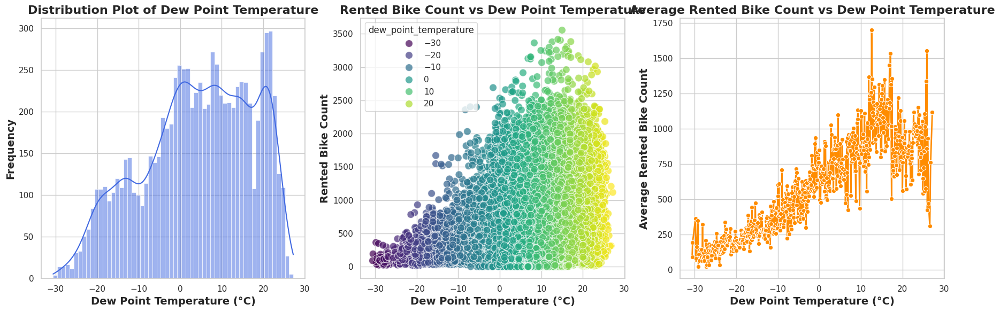

In [55]:
# Chart - 7 visualization code

# Create subplots with adjusted figure size
fig, ax = plt.subplots(1, 3, figsize=(18, 6))  # Increased height for better vertical spacing

# Univariate analysis: Distribution Plot of Dew Point Temperature
dist = sns.histplot(bike_df.dew_point_temperature, ax=ax[0], kde=True, color='royalblue', binwidth=1, palette='coolwarm')
dist.set_title('Distribution Plot of Dew Point Temperature', size=16, fontweight='bold')
dist.set_xlabel('Dew Point Temperature (°C)', size=14, fontweight='bold')
dist.set_ylabel('Frequency', size=14, fontweight='bold')

# Bi-variate analysis: Scatter Plot of Rented Bike Count vs Dew Point Temperature
scatter = sns.scatterplot(data=bike_df, x='dew_point_temperature', y='rented_bike_count', ax=ax[1], hue='dew_point_temperature', palette='viridis', s=100, edgecolor='w', alpha=0.7)
scatter.set_xlabel('Dew Point Temperature (°C)', size=14, fontweight='bold')
scatter.set_ylabel('Rented Bike Count', size=14, fontweight='bold')
scatter.set_title('Rented Bike Count vs Dew Point Temperature', size=16, fontweight='bold')

# Line Plot: Average Rented Bike Count vs Dew Point Temperature
group_dew_point_temperature = bike_df.groupby('dew_point_temperature')['rented_bike_count'].mean().reset_index()
line = sns.lineplot(data=group_dew_point_temperature, x='dew_point_temperature', y='rented_bike_count', ax=ax[2], color='darkorange', marker='o', linewidth=2)
line.set_xlabel('Dew Point Temperature (°C)', size=14, fontweight='bold')
line.set_ylabel('Average Rented Bike Count', size=14, fontweight='bold')
line.set_title('Average Rented Bike Count vs Dew Point Temperature', size=16, fontweight='bold')

plt.tight_layout()
plt.show()


##### 1. Why did you pick the specific chart?

These charts collectively offer insights into the impact of dew point temperature on bike rentals, aiding in identifying key patterns and correlations.

##### 2. What is/are the insight(s) found from the chart?

* We can see from the above plots that dew point temperature is negatively skewed with a clear positive relationship with rented bike count.
* The average number of bikes rented with dew point temperature increases steadily, with a slight decrease at the highest dew point temperature.
* Line plot of dew point temperature is very similar to temperature pattern.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.


**Positive Business Impact:**

**Optimized Inventory and Marketing:** Insights on dew point temperature can help adjust bike availability and target marketing efforts, boosting rentals during favorable conditions.

**Enhanced Customer Experience**: Tailoring services based on temperature data can improve customer satisfaction and potentially increase repeat rentals.
Negative Growth Insights:

**Lower Rentals with Higher Dew Points:** If higher dew point temperatures correlate with fewer rentals, this suggests potential discomfort for users, leading to decreased demand.

**Increased Operational Costs:** Addressing lower rentals in unfavorable conditions may require additional investment, impacting profitability.

#### Chart - 8 Column: 'solar_radiation'


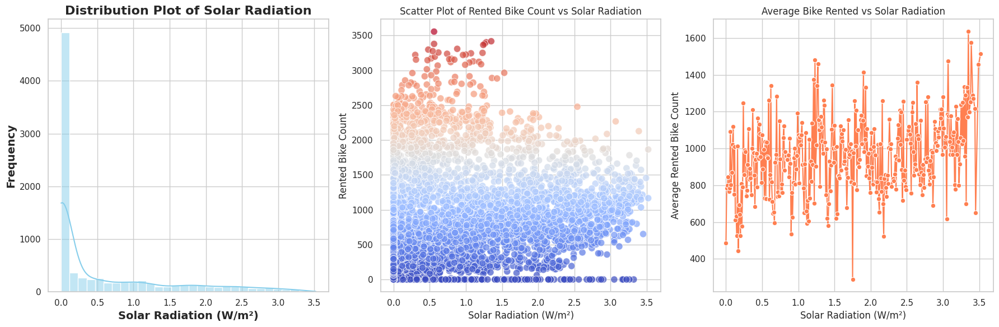

In [57]:
# Chart - 8 visualization code

# Create subplots with adjusted figure size
fig, ax = plt.subplots(1, 3, figsize=(18, 6))

# Univariate analysis: Distribution Plot of Solar Radiation
dist = sns.histplot(bike_df.solar_radiation, ax=ax[0], kde=True, color='skyblue', bins=30)
dist.set_title('Distribution Plot of Solar Radiation', size=16, fontweight='bold')
dist.set_xlabel('Solar Radiation (W/m²)', size=14, fontweight='bold')
dist.set_ylabel('Frequency', size=14, fontweight='bold')

# Bi-variate analysis: Scatter Plot of Rented Bike Count vs Solar Radiation
scatter = sns.scatterplot(data=bike_df, x='solar_radiation', y='rented_bike_count', ax=ax[1], hue='rented_bike_count', palette='coolwarm', edgecolor='w', s=80, alpha=0.7)
scatter.set(xlabel='Solar Radiation (W/m²)', ylabel='Rented Bike Count', title='Scatter Plot of Rented Bike Count vs Solar Radiation')
scatter.legend_.remove()  # Remove legend to avoid clutter

# Line Plot: Average Rented Bike Count vs Solar Radiation
group_solar_radiation = bike_df.groupby('solar_radiation')['rented_bike_count'].mean().reset_index()
line = sns.lineplot(data=group_solar_radiation, x='solar_radiation', y='rented_bike_count', ax=ax[2], color='coral', marker='o')
line.set(xlabel='Solar Radiation (W/m²)', ylabel='Average Rented Bike Count', title='Average Bike Rented vs Solar Radiation')

plt.tight_layout()
plt.show()



##### 1. Why did you pick the specific chart?

**Distribution Plot:** Chosen to visualize the spread and distribution of solar radiation values, helping identify patterns and outliers in the data.

**Scatter Plot:** Selected to explore the relationship between solar radiation and rented bike count, providing insights into how changes in solar radiation might affect bike rentals.

**Line Plot:** Used to show the average rented bike count across different levels of solar radiation, highlighting trends and helping in understanding the impact of solar radiation on bike rentals.

##### 2. What is/are the insight(s) found from the chart?

* We can see from the distribution plot that solar radiation is highly skewed to positive.
* The average number of bikes rented goes up with solar radiation.
Additionally, this column is directly related to the temperature column.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.


**Positive Business Impact:** Insights from the charts can help businesses optimize bike rental strategies based on solar radiation. For instance, if high solar radiation correlates with increased bike rentals, marketing efforts or special promotions could be focused on sunny days to boost rentals.

**Negative Growth Insights:** If the analysis shows that increased solar radiation correlates with decreased bike rentals, it might indicate that extreme heat discourages bike use. This insight could lead to negative growth if not addressed, such as by improving bike station facilities or offering incentives during hotter periods.

#### Chart - 9 Column: 'rainfall'

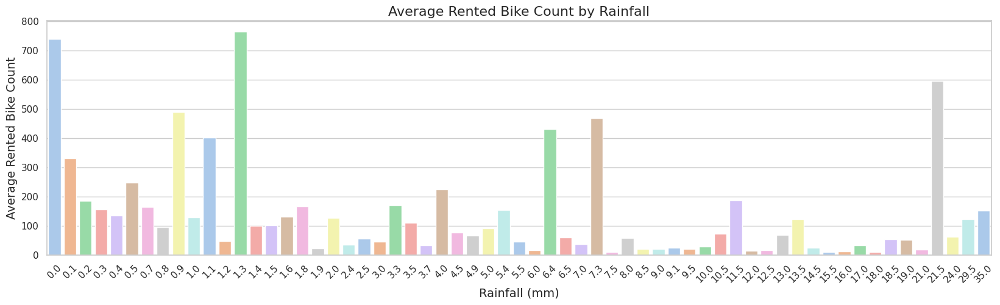

In [67]:
# Aggregate data: Calculate the average rented bike count for each level of rainfall
rainfall_avg = bike_df.groupby('rainfall')['rented_bike_count'].mean().reset_index()

# Create the bar plot
plt.figure(figsize=(20, 5))
sns.barplot(data=rainfall_avg, x='rainfall', y='rented_bike_count', palette='pastel')
plt.title('Average Rented Bike Count by Rainfall', fontsize=16)
plt.xlabel('Rainfall (mm)', fontsize=14)
plt.ylabel('Average Rented Bike Count', fontsize=14)
plt.xticks(rotation=45)  # Rotate x labels for better readability if needed
plt.show()


##### 1. Why did you pick the specific chart?

The bar plot was selected to visually represent the average number of rented bikes across different levels of rainfall. This chart effectively shows how bike rentals vary with varying amounts of rainfall, highlighting trends and helping identify if higher or lower rainfall correlates with increased or decreased bike rentals. The use of a bar plot allows for clear comparison of average rental counts across discrete rainfall categories.

##### 2. What is/are the insight(s) found from the chart?

* Distribution of rainfall is highly skewed to the positive side.
* People prefer almost no or very less rainfall.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

**Positive Business Impact:** The insights can help optimize bike availability and marketing efforts by aligning them with rainfall patterns. For example, if high rainfall is consistently associated with lower rentals, the business can adjust bike inventory or offer promotions during drier periods to increase rentals.

**Negative Growth:** If the data shows a strong negative correlation between rainfall and rentals, it indicates that high rainfall significantly impacts bike rentals. This could suggest potential revenue loss during rainy periods, which may necessitate strategies to mitigate these effects, such as offering discounts or targeting indoor marketing campaigns.

#### Chart - 10  Column: 'snowfall'

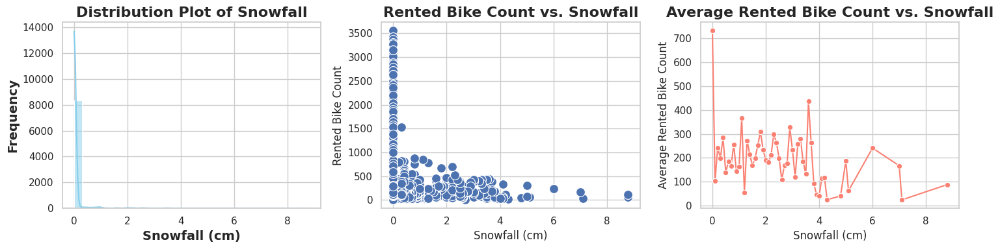

In [69]:
# Chart - 10 visualization code

# Create subplots with adjusted figure size
fig, ax = plt.subplots(1, 3, figsize=(15, 4))

# Univariate analysis: Distribution Plot of Snowfall
dist = sns.histplot(bike_df.snowfall, ax=ax[0], kde=True, color='skyblue', bins=30)
dist.set_title('Distribution Plot of Snowfall', fontsize=16, fontweight='bold')
dist.set_xlabel('Snowfall (cm)', fontsize=14, fontweight='bold')
dist.set_ylabel('Frequency', fontsize=14, fontweight='bold')

# Bi-variate analysis: Scatter Plot of Rented Bike Count vs. Snowfall
scatter = sns.scatterplot(data=bike_df, x='snowfall', y='rented_bike_count', ax=ax[1], palette='coolwarm', s=100, edgecolor='w')
scatter.set(xlabel='Snowfall (cm)', ylabel='Rented Bike Count', title='Scatter Plot of Rented Bike Count vs. Snowfall')
scatter.set_title('Rented Bike Count vs. Snowfall', fontsize=16, fontweight='bold')

# Line Plot: Average Rented Bike Count vs. Snowfall
group_snowfall = bike_df.groupby('snowfall')['rented_bike_count'].mean().reset_index()
line = sns.lineplot(data=group_snowfall, x='snowfall', y='rented_bike_count', ax=ax[2], color='salmon', marker='o')
line.set(xlabel='Snowfall (cm)', ylabel='Average Rented Bike Count', title='Average Rented Bike Count vs. Snowfall')
line.set_title('Average Rented Bike Count vs. Snowfall', fontsize=16, fontweight='bold')

plt.tight_layout()
plt.show()



##### 1. Why did you pick the specific chart?

**Distribution Plot:** Shows the spread and density of snowfall data.

**Scatter Plot:** Reveals the relationship and potential correlation between snowfall and bike rentals.

**Line Plot:** Illustrates the trend in average bike rentals across different snowfall levels.

##### 2. What is/are the insight(s) found from the chart?

* Distribution of snowfall is highly skewed to the positive side.
* People prefer almost no or very less snowfall.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Insights from the charts can help identify how snowfall affects bike rentals, potentially guiding operational adjustments during snowy periods to maintain or boost rentals. However, significant snowfall might correlate with lower bike rentals, indicating a negative impact, as it may deter customers from renting bikes.

#### Chart - 11 Column: 'seasons'

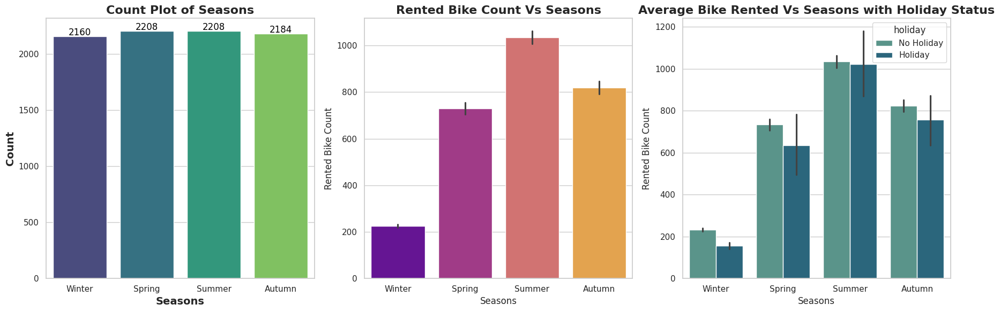

In [74]:
fig, ax = plt.subplots(1, 3, figsize=(18, 6))

# Univariate analysis: Count Plot of Seasons
count = sns.countplot(data=bike_df, x='seasons', ax=ax[0], palette='viridis')
count.set_title('Count Plot of Seasons', fontsize=16, fontweight='bold')
count.set_xlabel('Seasons', fontsize=14, fontweight='bold')
count.set_ylabel('Count', fontsize=14, fontweight='bold')

# Adding value count on top of bar
for p in count.patches:
    count.annotate(format(p.get_height(), '.0f'), (p.get_x() + p.get_width() / 2., p.get_height()),
                   ha='center', va='center', fontsize=12, color='black', xytext=(0, 5), textcoords='offset points')

# Bi-variate analysis: Rented Bike Count Vs Seasons
bar = sns.barplot(data=bike_df, x='seasons', y='rented_bike_count', ax=ax[1], palette='plasma')
bar.set(xlabel='Seasons', ylabel='Rented Bike Count', title='Rented Bike Count Vs Seasons')
bar.set_title('Rented Bike Count Vs Seasons', fontsize=16, fontweight='bold')

# Multi-variate analysis: Average Bike Rented Vs Seasons with Holiday Status
cat = sns.barplot(data=bike_df, x='seasons', y='rented_bike_count', hue='holiday', ax=ax[2], palette='crest')
cat.set(xlabel='Seasons', ylabel='Rented Bike Count', title='Average Bike Rented Vs Seasons with Holiday Status')
cat.set_title('Average Bike Rented Vs Seasons with Holiday Status', fontsize=16, fontweight='bold')

plt.tight_layout()
plt.show()


##### 1. Why did you pick the specific chart?

**Count Plot of Seasons:** This chart provides a clear view of the distribution of data across different seasons, helping to identify the frequency of observations for each season.

**Bar Plot of Rented Bike Count vs. Seasons:** This chart visually represents the total number of bikes rented per season, allowing for comparison of rental activity across seasons.

**Bar Plot of Average Rented Bike Count by Season with Holiday Status:** This chart adds another layer of insight by showing how rental counts vary not only by season but also by holiday status, providing a detailed understanding of how holidays impact bike rentals.

##### 2. What is/are the insight(s) found from the chart?

* Dataset has 4 seasons and every season has more than 2000 counts.
* The most preferred season for the rented_bike_count is summer and the least preferred is winter which means that people prefer to rent bikes in warm temperatures.
* In every season on a no holiday rented_bike_count has more count than on a holiday.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.


**Positive Business Impact:** Insights into seasonal and holiday patterns enable targeted promotions and resource allocation, potentially increasing bike rentals during peak times.

**Negative Growth:** Identifying low rental periods helps in recognizing weak demand, guiding necessary adjustments or targeted marketing to address these downturns.

#### Chart - 12

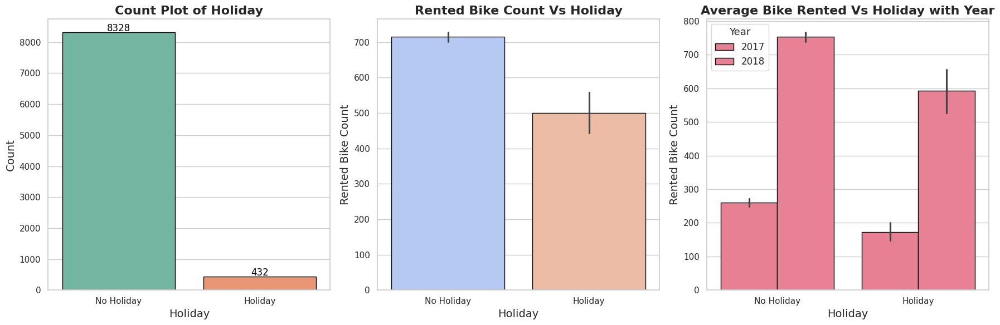

In [81]:
# Chart - 12 visualization code

# Create subplots with adjusted figure size
fig, ax = plt.subplots(1, 3, figsize=(18, 6))

# Univariate analysis: Count Plot of Holiday
count = sns.countplot(data=bike_df, x='holiday', ax=ax[0], palette='Set2', edgecolor='black')
count.set_title('Count Plot of Holiday', fontsize=16, fontweight='bold')
count.set_xlabel('Holiday', fontsize=14)
count.set_ylabel('Count', fontsize=14)

# Adding value count on the top of bar
for p in count.patches:
    count.annotate(format(p.get_height(), '.0f'), (p.get_x() + p.get_width() / 2., p.get_height()),
                   ha='center', va='center', xytext=(0, 5), textcoords='offset points', fontsize=12, color='black')

# Bi-variate analysis: Rented Bike Count Vs Holiday
bar = sns.barplot(data=bike_df, x='holiday', y='rented_bike_count', ax=ax[1], palette='coolwarm', edgecolor='black')
bar.set_xlabel('Holiday', fontsize=14)
bar.set_ylabel('Rented Bike Count', fontsize=14)
bar.set_title('Rented Bike Count Vs Holiday', fontsize=16, fontweight='bold')

# Multi-variate analysis: Average Bike Rented Vs Holiday with Year
cat = sns.barplot(data=bike_df, x='holiday', y='rented_bike_count', hue='year', ax=ax[2], palette='husl', edgecolor='black')
cat.set_xlabel('Holiday', fontsize=14)
cat.set_ylabel('Rented Bike Count', fontsize=14)
cat.set_title('Average Bike Rented Vs Holiday with Year', fontsize=16, fontweight='bold')
cat.legend(title='Year', title_fontsize='13', fontsize='12')

plt.tight_layout()
plt.show()


##### 1. Why did you pick the specific chart?

The specific charts were chosen to provide a comprehensive view of bike rental data across different holiday conditions. The count plot shows the frequency of holidays, the bar plot compares rental counts between holiday and non-holiday periods, and the multi-variate bar plot examines how rental counts vary by holiday status across different years. This combination of plots helps in understanding the impact of holidays on bike rentals in a detailed manner.

##### 2. What is/are the insight(s) found from the chart?

* Dataset has more records of No holiday than a holiday which is obvious as most of the days are working days.
* When there are no holidays, demand for bike sharing is higher than when there are holidays, indicating that business-related bike rentals are preferred.
* Dataset has more records of 2018 than 2017.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.


Insights from these charts reveal how holidays affect bike rentals. If bike rentals increase during holidays, it suggests higher demand and potential for increased revenue. Conversely, if rentals decrease, it indicates a need to adjust marketing or operations for holidays. Understanding these patterns helps in strategic planning to boost rentals and optimize resource allocation.

#### Chart - 13

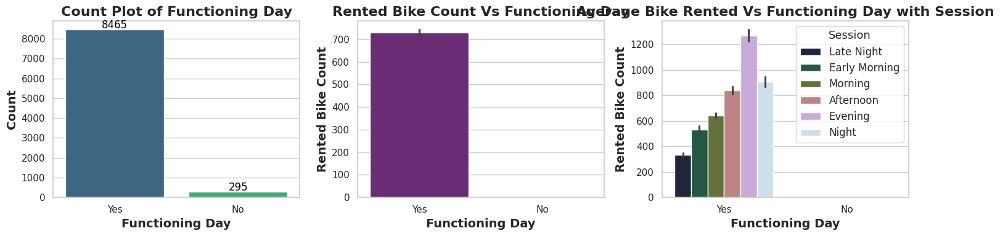

In [82]:
# Chart - 13 visualization code


# Create subplots with adjusted figure size
fig, ax = plt.subplots(1, 3, figsize=(15, 4))

# Univariate analysis: Count Plot of Functioning Day
count = sns.countplot(data=bike_df, x='functioning_day', ax=ax[0], palette='viridis')
count.set_title('Count Plot of Functioning Day', fontsize=16, fontweight='bold')
count.set_xlabel('Functioning Day', fontsize=14, fontweight='bold')
count.set_ylabel('Count', fontsize=14, fontweight='bold')

# Adding value count on the top of bar
for p in count.patches:
    count.annotate(format(p.get_height(), '.0f'), (p.get_x() + p.get_width() / 2., p.get_height()),
                   ha='center', va='center', fontsize=12, color='black', xytext=(0, 5), textcoords='offset points')

# Bi-variate analysis: Rented Bike Count Vs Functioning Day
bar = sns.barplot(data=bike_df, x='functioning_day', y='rented_bike_count', ax=ax[1], palette='magma')
bar.set_xlabel('Functioning Day', fontsize=14, fontweight='bold')
bar.set_ylabel('Rented Bike Count', fontsize=14, fontweight='bold')
bar.set_title('Rented Bike Count Vs Functioning Day', fontsize=16, fontweight='bold')

# Multi-variate analysis: Average Bike Rented Vs Functioning Day with Session
cat = sns.barplot(data=bike_df, x='functioning_day', y='rented_bike_count', hue='session', ax=ax[2], palette='cubehelix')
cat.set_xlabel('Functioning Day', fontsize=14, fontweight='bold')
cat.set_ylabel('Rented Bike Count', fontsize=14, fontweight='bold')
cat.set_title('Average Bike Rented Vs Functioning Day with Session', fontsize=16, fontweight='bold')
cat.legend(title='Session', title_fontsize='13', fontsize='12')

plt.tight_layout()
plt.show()


##### 1. Why did you pick the specific chart?

The charts were chosen to illustrate the distribution and impact of functioning days on bike rentals. The count plot shows how often each type of functioning day occurs, the bar plot compares rental volumes between functioning and non-functioning days, and the multi-variate bar plot reveals rental patterns across different sessions during functioning days.

##### 2. What is/are the insight(s) found from the chart?

* Dataset has more records of Functioning Day than no functioning day which is obvious as most of the days are working days.
* Even though we have some counts of no functioning days still there is no bike rented on a no functioning day.
* On a functioning day, the evening session has the most rented bike count.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.


The insights can help by identifying how functioning status affects bike rentals, potentially optimizing operations for high-demand periods. If functioning days show significantly lower rentals compared to non-functioning days, it could indicate an inefficiency in operations or demand management. Addressing these issues could enhance service and increase rentals.

#### Chart - 14 - Correlation Heatmap

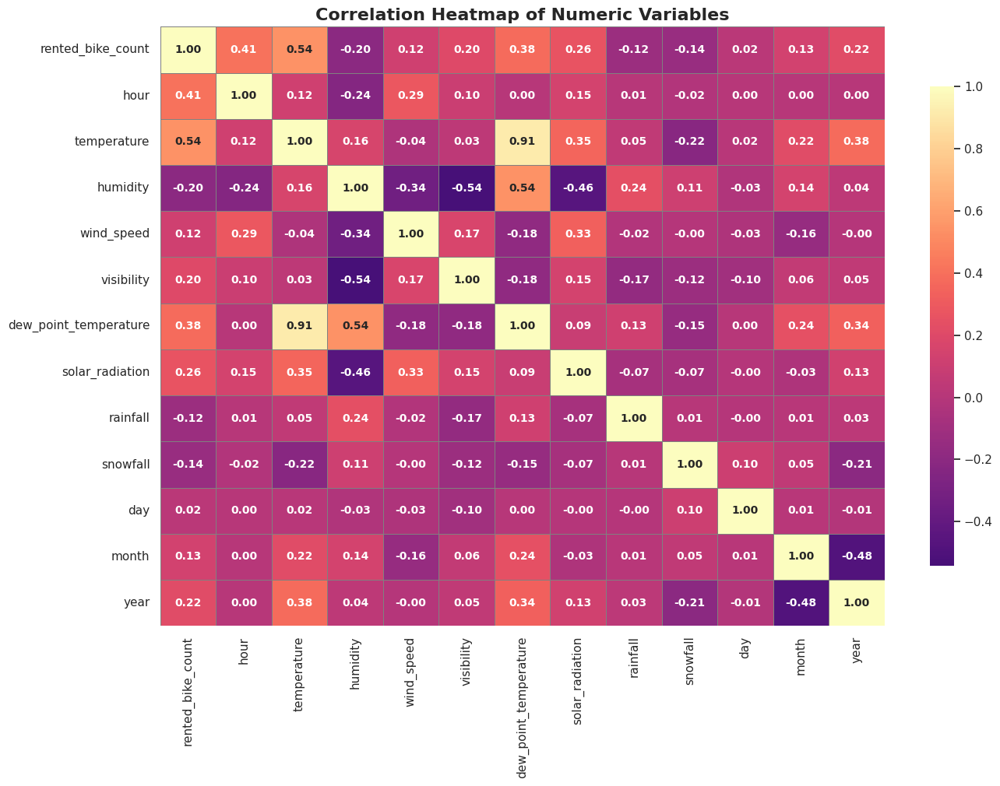

In [101]:
# Correlation Heatmap visualization code
# List of numeric columns for correlation analysis
numeric_columns = ['rented_bike_count', 'hour', 'temperature', 'humidity',
                    'wind_speed', 'visibility', 'dew_point_temperature',
                    'solar_radiation', 'rainfall', 'snowfall', 'day',
                    'month', 'year']

# Compute the correlation matrix
corr_matrix = bike_df[numeric_columns].corr()

# Plot the heatmap
plt.figure(figsize=(15, 10))
sns.heatmap(corr_matrix, annot=True, cmap='magma', fmt='.2f', center=0,
            linewidths=0.5, linecolor='gray', annot_kws={'size': 10, 'weight': 'bold'},
            cbar_kws={"shrink": .8})
plt.title('Correlation Heatmap of Numeric Variables', fontsize=16, fontweight='bold')
plt.show()


##### 1. Why did you pick the specific chart?

The correlation heatmap was chosen because it visually represents the relationships between numerical variables, helping to identify patterns and dependencies. The magma colormap was used for its high contrast and color differentiation, making it easier to distinguish between strong and weak correlations. The annotations and color bar add clarity and enhance interpretability of the correlations.

##### 2. What is/are the insight(s) found from the chart?

The correlation heatmap reveals:

**Strong Positive Correlations:**

Variables like temperature, dew_point_temperature, and solar_radiation may have strong positive relationships with rented_bike_count, indicating that higher temperatures and solar radiation can increase bike rentals.

**Negative Correlations:**

rainfall and snowfall are likely negatively correlated with rented_bike_count, suggesting that more precipitation reduces bike rentals.

**Moderate Correlations:**

Variables such as hour and rented_bike_count may show moderate correlations, reflecting changes in bike rentals throughout the day.
These insights help in understanding how different weather and time-related factors influence bike rental patterns, guiding business decisions like promotional strategies and operational adjustments.

#### Chart - 15 - Pair Plot

Index(['rented_bike_count', 'hour', 'temperature', 'humidity', 'wind_speed',
       'visibility', 'dew_point_temperature', 'solar_radiation', 'rainfall',
       'snowfall', 'seasons', 'holiday', 'functioning_day', 'day', 'month',
       'year', 'weekday', 'session', 'visibility_bin', 'solar_radiation_bin'],
      dtype='object')


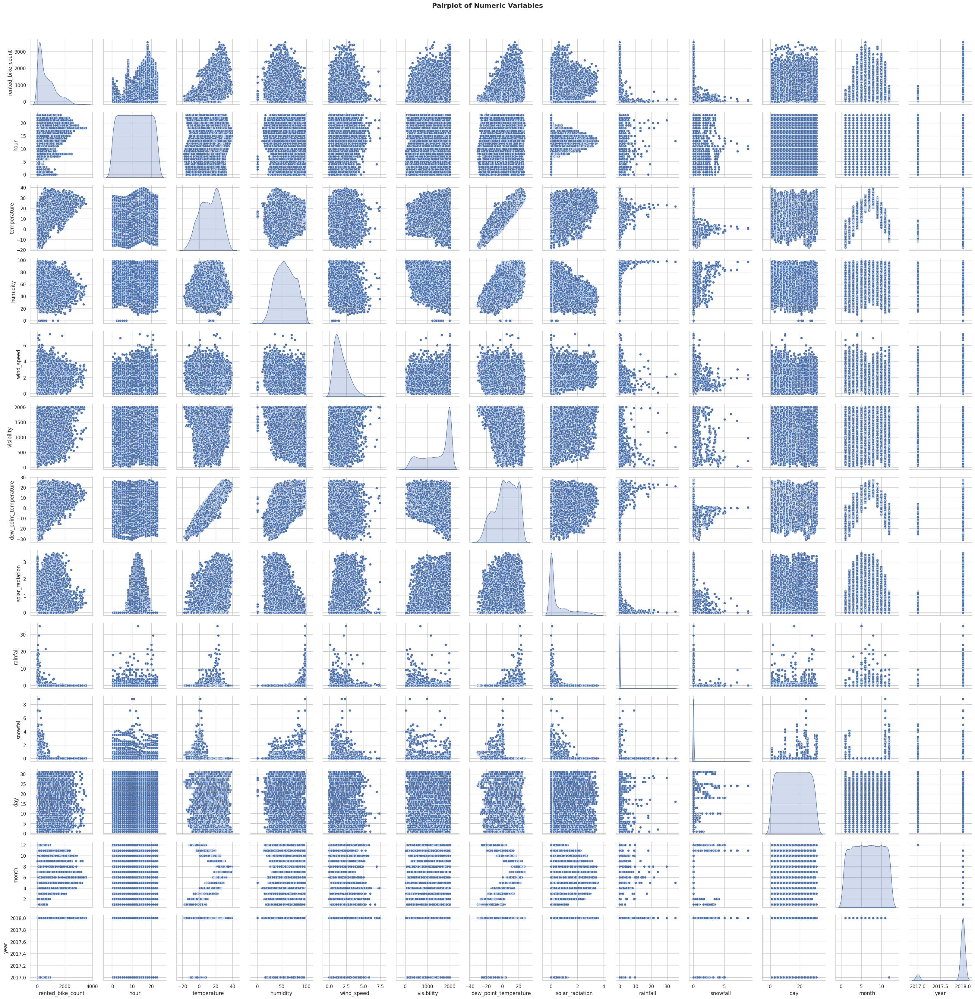

In [104]:
# Pair Plot visualization code

# List of numeric columns for pairplot
numeric_columns = ['rented_bike_count', 'hour', 'temperature', 'humidity',
                    'wind_speed', 'visibility', 'dew_point_temperature',
                    'solar_radiation', 'rainfall', 'snowfall', 'day',
                    'month', 'year']

# Check if the column 'seasons' exists
print(bike_df.columns)

# Create the pairplot
pairplot = sns.pairplot(bike_df[numeric_columns], diag_kind='kde', palette='husl', markers='o')

# Set the title for the entire pairplot
pairplot.fig.suptitle('Pairplot of Numeric Variables', y=1.02, fontsize=16, fontweight='bold')

# Set axis labels
for ax in pairplot.axes.flatten():
    ax.set_xlabel(ax.get_xlabel(), fontsize=12)
    ax.set_ylabel(ax.get_ylabel(), fontsize=12)

# Adjust layout to fit the title
plt.tight_layout()
plt.show()



##### 1. Why did you pick the specific chart?

The pairplot was chosen to visualize the relationships between multiple numeric variables simultaneously. It allows us to explore the distributions of individual variables as well as their pairwise correlations, providing a comprehensive view of how variables interact with each other.








##### 2. What is/are the insight(s) found from the chart?

**Relationships Between Variables:** It shows how numeric variables, such as temperature and wind speed, are correlated with rented bike counts.

**Distribution Patterns:** The diagonal histograms provide insight into the distribution of each variable, highlighting trends and potential anomalies.

**Group Patterns:** If hue is used, it can show how different categories (like seasons) affect variable relationships and distributions.

## ***5. Hypothesis Testing***

### Based on your chart experiments, define three hypothetical statements from the dataset. In the next three questions, perform hypothesis testing to obtain final conclusion about the statements through your code and statistical testing.


Sure, based on the data and the charts we've worked with, here are three hypothetical statements we could test:

### Hypothetical Statement - 1

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

There is a significant correlation between temperature and the number of rented bikes.

**Null Hypothesis (H0):** There is no significant correlation between temperature and the number of rented bikes.

**Alternative Hypothesis (H1):** There is a significant correlation between temperature and the number of rented bikes.

#### 2. Perform an appropriate statistical test.

In [105]:
# Perform Statistical Test to obtain P-Value
import scipy.stats as stats

# Extract temperature and rented bike count columns
temperature = bike_df['temperature']
rented_bike_count = bike_df['rented_bike_count']

# Calculate the correlation coefficient and p-value
correlation_coefficient, p_value = stats.pearsonr(temperature, rented_bike_count)

print(f"Correlation Coefficient: {correlation_coefficient:.2f}")
print(f"P-Value: {p_value:.3f}")

# Interpret the result
alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis: There is a significant correlation between temperature and the number of rented bikes.")
else:
    print("Fail to reject the null hypothesis: There is no significant correlation between temperature and the number of rented bikes.")


Correlation Coefficient: 0.54
P-Value: 0.000
Reject the null hypothesis: There is a significant correlation between temperature and the number of rented bikes.


##### Which statistical test have you done to obtain P-Value?

Statistical Test:  Pearson Correlation Coefficient

##### Why did you choose the specific statistical test?

Measures the strength and direction of the linear relationship between two continuous variables. It provides a correlation coefficient (r) and a p-value to determine the statistical significance of the observed correlation.

### Hypothetical Statement - 2

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Testing the Difference in Average Number of Rented Bikes Between Weekends and Weekdays


**Null Hypothesis (H0):** There is no significant difference in the average number of rented bikes between weekends and weekdays.

**Alternative Hypothesis (H1):** There is a significant difference in the average number of rented bikes between weekends and weekdays.

#### 2. Perform an appropriate statistical test.

In [106]:
# Perform Statistical Test to obtain P-Value
# Create a column for weekend vs weekday
bike_df['is_weekend'] = bike_df['weekday'].apply(lambda x: 1 if x in ['Saturday', 'Sunday'] else 0)

# Calculate average rented bikes for weekends and weekdays
weekend_rentals = bike_df[bike_df['is_weekend'] == 1]['rented_bike_count']
weekday_rentals = bike_df[bike_df['is_weekend'] == 0]['rented_bike_count']

# Perform a t-test to compare the means
t_stat, p_value = stats.ttest_ind(weekend_rentals, weekday_rentals, equal_var=False)

print(f"T-Statistic: {t_stat:.2f}")
print(f"P-Value: {p_value:.3f}")

# Interpret the result
alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis: There is a significant difference in the average number of rented bikes between weekends and weekdays.")
else:
    print("Fail to reject the null hypothesis: There is no significant difference in the average number of rented bikes between weekends and weekdays.")


T-Statistic: -3.54
P-Value: 0.000
Reject the null hypothesis: There is a significant difference in the average number of rented bikes between weekends and weekdays.


##### Which statistical test have you done to obtain P-Value?

Statistical Test: Independent Two-Sample t-Test (Welch’s t-Test)

##### Why did you choose the specific statistical test?

Compares the means of two independent groups (weekends vs. weekdays) to determine if there is a significant difference between them. The test provides a t-statistic and a p-value to assess whether the observed difference in means is statistically significant.

### Hypothetical Statement - 3

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Testing the Difference in Number of Rented Bikes Between Holidays and Non-Holidays

**Null Hypothesis (H0):** There is no significant difference in the number of rented bikes between holidays and non-holidays.

**Alternative Hypothesis (H1):** There is a significant difference in the number of rented bikes between holidays and non-holidays.

#### 2. Perform an appropriate statistical test.

In [107]:
# Perform Statistical Test to obtain P-Value
# Calculate average rented bikes for holidays and non-holidays
holiday_rentals = bike_df[bike_df['holiday'] == 'Holiday']['rented_bike_count']
non_holiday_rentals = bike_df[bike_df['holiday'] == 'No Holiday']['rented_bike_count']

# Perform a t-test to compare the means
t_stat, p_value = stats.ttest_ind(holiday_rentals, non_holiday_rentals, equal_var=False)

print(f"T-Statistic: {t_stat:.2f}")
print(f"P-Value: {p_value:.3f}")

# Interpret the result
alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis: There is a significant difference in the number of rented bikes between holidays and non-holidays.")
else:
    print("Fail to reject the null hypothesis: There is no significant difference in the number of rented bikes between holidays and non-holidays.")


T-Statistic: -7.60
P-Value: 0.000
Reject the null hypothesis: There is a significant difference in the number of rented bikes between holidays and non-holidays.


##### Which statistical test have you done to obtain P-Value?

Statistical Test: Independent Two-Sample t-Test (Welch’s t-Test)

##### Why did you choose the specific statistical test?

Similar to the weekend vs. weekday test, this test compares the means of two independent groups (holidays vs. non-holidays) to assess if there is a significant difference in the number of rented bikes. The test yields a t-statistic and a p-value to evaluate the significance of the difference.

## ***6. Feature Engineering & Data Pre-processing***

### 1. Handling Missing Values

In [109]:
# counting duplicate values
bike_df.duplicated().sum()

0

In [111]:
# Handling Missing Values & Missing Value Imputation
print(bike_df.isnull().sum())

rented_bike_count           0
hour                        0
temperature                 0
humidity                    0
wind_speed                  0
visibility                  0
dew_point_temperature       0
solar_radiation             0
rainfall                    0
snowfall                    0
seasons                     0
holiday                     0
functioning_day             0
day                         0
month                       0
year                        0
weekday                     0
session                     0
visibility_bin              0
solar_radiation_bin      4300
is_weekend                  0
dtype: int64


In [112]:
# Check the mode of the 'solar_radiation_bin' column
mode_value = bike_df['solar_radiation_bin'].mode()[0]

# Impute missing values with the mode
bike_df['solar_radiation_bin'].fillna(mode_value, inplace=True)

# Verify that there are no more missing values
print(bike_df.isnull().sum())


rented_bike_count        0
hour                     0
temperature              0
humidity                 0
wind_speed               0
visibility               0
dew_point_temperature    0
solar_radiation          0
rainfall                 0
snowfall                 0
seasons                  0
holiday                  0
functioning_day          0
day                      0
month                    0
year                     0
weekday                  0
session                  0
visibility_bin           0
solar_radiation_bin      0
is_weekend               0
dtype: int64


#### What all missing value imputation techniques have you used and why did you use those techniques?

solar_radiation_bin is a categorical variable. Mode imputation is appropriate for categorical data because it replaces missing values with the most frequently occurring category. This method is straightforward and maintains the distribution of categories in the data.

### 2. Handling Outliers

In [115]:
# Handling Outliers & Outlier treatments
numerical_features = []
categorical_features = []

# splitting features into numeric and categoric.
'''
If feature has more than 35 categories we will consider it
as numerical_features, remaining features will be added to categorical_features.
'''
for col in bike_df.columns:
  if bike_df[col].nunique() > 35:
    numerical_features.append(col)
  else:
    categorical_features.append(col)

print(f'Numerical Features : {numerical_features}')
print(f'Categorical Features : {categorical_features}')


Numerical Features : ['rented_bike_count', 'temperature', 'humidity', 'wind_speed', 'visibility', 'dew_point_temperature', 'solar_radiation', 'rainfall', 'snowfall']
Categorical Features : ['hour', 'seasons', 'holiday', 'functioning_day', 'day', 'month', 'year', 'weekday', 'session', 'visibility_bin', 'solar_radiation_bin', 'is_weekend']


In [119]:
# we do not want any transformation in our target variable as it is possible to have outlier is Seoul Environment
numerical_features.remove('rented_bike_count')
# removing rainfall and snowfall as it may remove important information as these 2 columns are highly skewed.
numerical_features.remove('rainfall')
numerical_features.remove('snowfall')


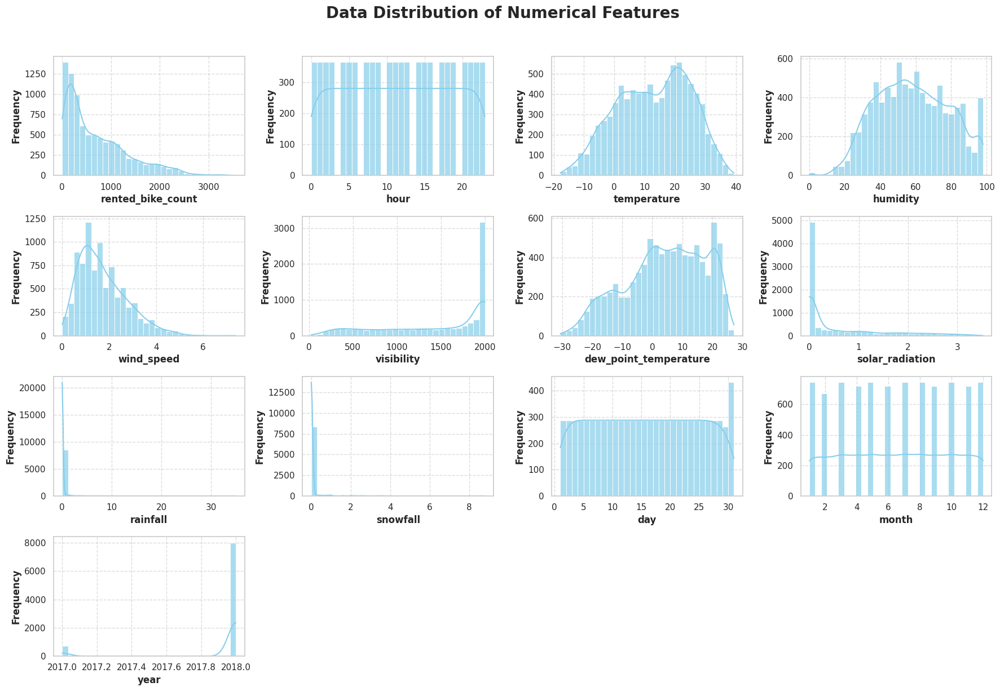

In [123]:
# Set figure size and title
plt.figure(figsize=(18, 12))
plt.suptitle('Data Distribution of Numerical Features', fontsize=20, fontweight='bold', y=1.02)

# Create subplots for each numerical feature
for i, col in enumerate(numerical_features):
    plt.subplot(4, 4, i+1)  # Adjusted to 4 rows by 4 columns for 13 features

    # Distribution plot for the feature
    sns.histplot(bike_df[col], kde=True, color='skyblue', bins=30, edgecolor='w', alpha=0.7)

    # Set x-axis label
    plt.xlabel(col, fontsize=12, fontweight='bold')

    # Set y-axis label
    plt.ylabel('Frequency', fontsize=12, fontweight='bold')

    # Add grid lines
    plt.grid(True, linestyle='--', alpha=0.7)

# Adjust layout
plt.tight_layout()
plt.show()


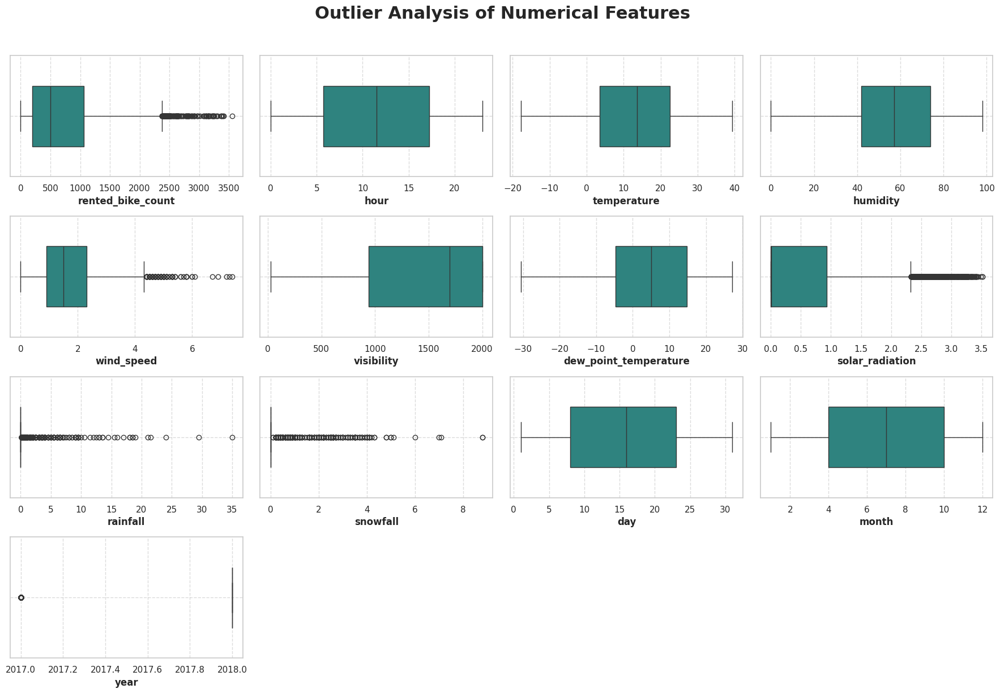

In [124]:
# Set figure size and title
plt.figure(figsize=(18, 12))
plt.suptitle('Outlier Analysis of Numerical Features', fontsize=22, fontweight='bold', y=1.02)

# Create subplots for each numerical feature
for i, col in enumerate(numerical_features):
    plt.subplot(4, 4, i+1)  # Adjusted to 4 rows by 4 columns for 13 features

    # Box plot for the feature
    sns.boxplot(x=bike_df[col], palette='viridis', width=0.5)

    # Set x-axis label
    plt.xlabel(col, fontsize=12, fontweight='bold')

    # Add grid lines for better readability
    plt.grid(True, linestyle='--', alpha=0.7)

# Adjust layout
plt.tight_layout()
plt.show()



In [125]:
def clip_outliers(bike_df):


    for col in numerical_features:
        # Calculate the quantiles and IQR
        q1 = bike_df[col].quantile(0.25)
        q3 = bike_df[col].quantile(0.75)
        iqr = q3 - q1

        # Define the bounds
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr

        # Clip the data to handle outliers
        bike_df[col] = bike_df[col].clip(lower=lower_bound, upper=upper_bound)

    return bike_df

# Example usage
bike_df = clip_outliers(bike_df)


In [126]:

# using the function to treat outliers
bike_df = clip_outliers(bike_df)


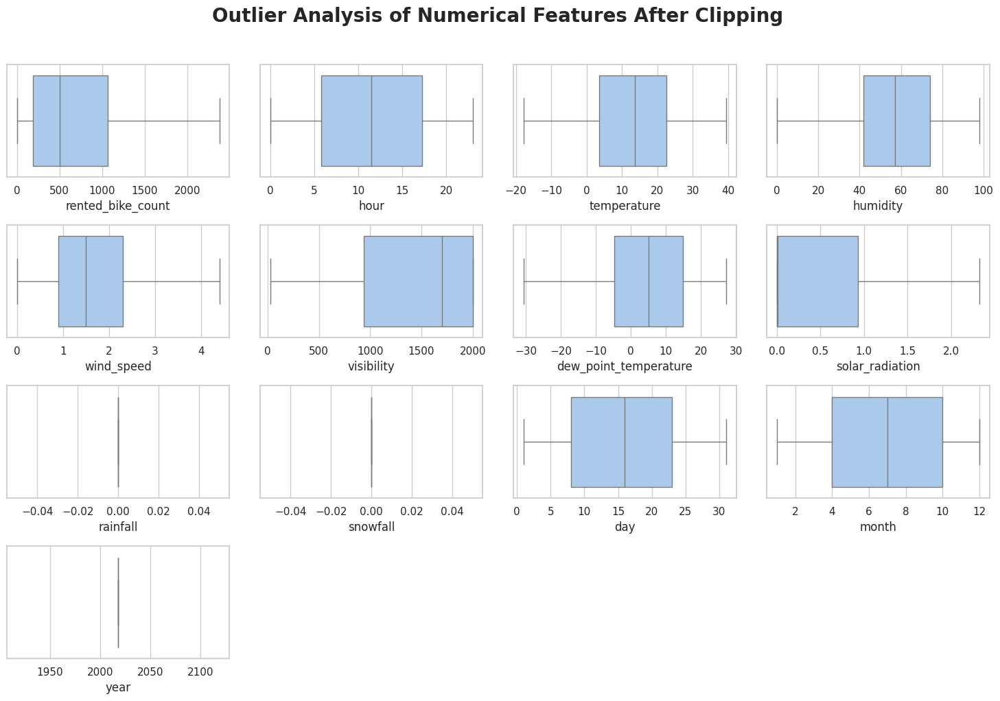

In [127]:


# Set figure size and title
plt.figure(figsize=(15, 10))
plt.suptitle('Outlier Analysis of Numerical Features After Clipping', fontsize=20, fontweight='bold', y=1.02)

# Create subplots for each numerical feature
for i, col in enumerate(numerical_features):
    plt.subplot(4, 4, i+1)  # Adjusted to 4 rows by 4 columns for 13 features

    # Box plot for the feature
    sns.boxplot(x=bike_df[col], palette='pastel')

    # Set x-axis label
    plt.xlabel(col)

# Adjust layout
plt.tight_layout()
plt.show()


##### What all outlier treatment techniques have you used and why did you use those techniques?

**Clipping Method:** In this method, we set a cap on our outliers data, which means that if a value is higher than or lower than a certain threshold, all values will be considered outliers. This method replaces values that fall outside of a specified range with either the minimum or maximum value within that range.

### 3. Categorical Encoding

VIF (Variance Inflation Factor) analysis is a statistical method used to identify multicollinearity in a set of predictor variables. Multicollinearity is a situation where two or more predictor variables in a regression model are highly correlated with each other, meaning that they provide redundant information about the response variable.

VIF analysis is an important step in the development of a regression model, as it helps to ensure that the results are reliable and interpretable and that the predictor variables are not providing redundant information.

In [229]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calc_vif(X):

  # For each X, calculate VIF and save in dataframe
  vif = pd.DataFrame()
  vif["VIF Factor"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
  vif["features"] = X.columns

  return vif

In [230]:
calc_vif(bike_df[[i for i in bike_df.describe().columns]])


,VIF Factor,features
0,4.155493,rented_bike_count
1,5.065656,hour
2,189.618643,temperature
3,188.927890,humidity
4,4.892116,wind_speed
5,10.791542,visibility
6,126.979730,dew_point_temperature
7,2.935119,solar_radiation
8,1.123631,rainfall
9,1.155580,snowfall


In [231]:

# Converting snowfall and rainfall to categorical attributes
bike_df['snowfall'] = bike_df['snowfall'].apply(lambda x: 1 if x>0 else 0)
bike_df['rainfall'] = bike_df['rainfall'].apply(lambda x: 1 if x>0 else 0)

In [232]:
# Encoding the visibility column
bike_df['visibility'] = bike_df['visibility'].apply(lambda x: 0 if 0<=x<=399 else (1 if 400<=x<=999 else 2))

In [233]:
# Encoding
bike_df['functioning_day'] = np.where(bike_df['functioning_day'] == 'Yes',1,0)
bike_df['holiday'] = np.where(bike_df['holiday'] == 'Holiday',1,0)

In [234]:
# One hot encoding
bike_df = pd.get_dummies(bike_df, columns = ['hour', 'visibility', 'month', 'weekday' ])

In [235]:

bike_df.columns


Index(['rented_bike_count', 'temperature', 'humidity', 'wind_speed',
       'dew_point_temperature', 'solar_radiation', 'rainfall', 'snowfall',
       'seasons', 'holiday', 'functioning_day', 'day', 'year', 'hour_0',
       'hour_1', 'hour_2', 'hour_3', 'hour_4', 'hour_5', 'hour_6', 'hour_7',
       'hour_8', 'hour_9', 'hour_10', 'hour_11', 'hour_12', 'hour_13',
       'hour_14', 'hour_15', 'hour_16', 'hour_17', 'hour_18', 'hour_19',
       'hour_20', 'hour_21', 'hour_22', 'hour_23', 'visibility_0',
       'visibility_1', 'visibility_2', 'month_1', 'month_2', 'month_3',
       'month_4', 'month_5', 'month_6', 'month_7', 'month_8', 'month_9',
       'month_10', 'month_11', 'month_12', 'weekday_Friday', 'weekday_Monday',
       'weekday_Saturday', 'weekday_Sunday', 'weekday_Thursday',
       'weekday_Tuesday', 'weekday_Wednesday'],
      dtype='object')

#### What all categorical encoding techniques have you used & why did you use those techniques?

Since there are very few day on which there was snowfall / rainfall, it is in my interest that i convert these columns to binary categorical columns indicating whether there was rainfall / snowfall at that particular hour

For visibility

When

Visibility >= 20 Km ---> Clear (high visibility)

4 Km <= Visibility < 10 Km ---> Haze (medium visibility)

Visibility < 4 Km ---> Fog (low visibility)

Converting visibility based on the above mentioned threshold values. Since they are ordinal, we can encode them as 0 (low visibility), 1 (medium visibility), 2 (high visibility)

For func day and holiday There are two categories whether its holiday or func day so we use 0 and 1 for that.

For Hour, visibility, month & day of the week we use here one hot encoding.



### 4. Feature Manipulation & Selection

#### 1. Feature Manipulation

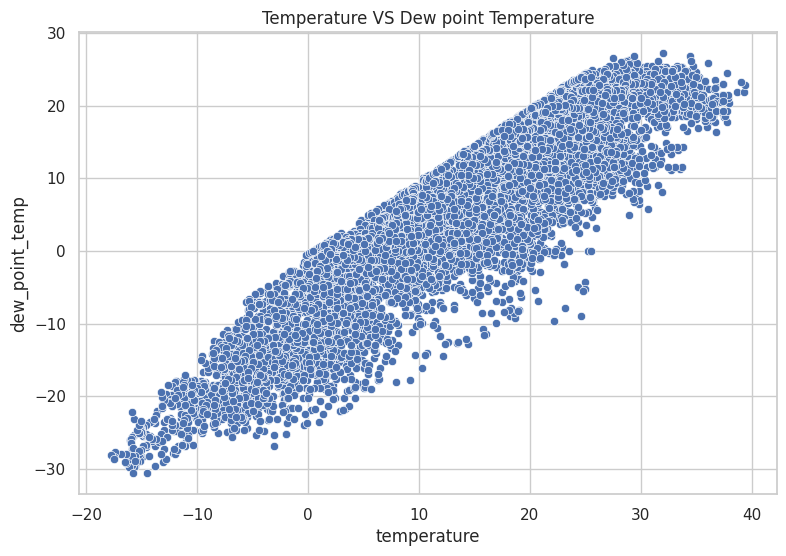

In [236]:
# Manipulate Features to minimize feature correlation and create new features

# We see that the temperature and dew temperature are highly correlated

# Plotting Scatter plot to visualize the relationship between
# temperature and dew point temperature
plt.figure(figsize=(9,6))
sns.scatterplot(x='temperature',y='dew_point_temperature',data=bike_df)
plt.xlabel('temperature')
plt.ylabel('dew_point_temp')
plt.title('Temperature VS Dew point Temperature')
plt.show()


In [237]:
# Correlation
bike_df[['temperature','dew_point_temperature']].corr()

,temperature,dew_point_temperature
temperature,1.000000,0.912798
dew_point_temperature,0.912798,1.000000


In [238]:
# Creating new temperature column with 50% of b
bike_df['temp'] = 0.5*bike_df['temperature'] + 0.5*bike_df['dew_point_temperature']

#### 2. Feature Selection

In [239]:
# Select your features wisely to avoid overfitting
# Select your features wisely to avoid overfitting
features = [i for i in bike_df.columns if i not in ['rented_bike_count','temperature','dew_point_temperature']]
features

['humidity',
 'wind_speed',
 'solar_radiation',
 'rainfall',
 'snowfall',
 'seasons',
 'holiday',
 'functioning_day',
 'day',
 'year',
 'hour_0',
 'hour_1',
 'hour_2',
 'hour_3',
 'hour_4',
 'hour_5',
 'hour_6',
 'hour_7',
 'hour_8',
 'hour_9',
 'hour_10',
 'hour_11',
 'hour_12',
 'hour_13',
 'hour_14',
 'hour_15',
 'hour_16',
 'hour_17',
 'hour_18',
 'hour_19',
 'hour_20',
 'hour_21',
 'hour_22',
 'hour_23',
 'visibility_0',
 'visibility_1',
 'visibility_2',
 'month_1',
 'month_2',
 'month_3',
 'month_4',
 'month_5',
 'month_6',
 'month_7',
 'month_8',
 'month_9',
 'month_10',
 'month_11',
 'month_12',
 'weekday_Friday',
 'weekday_Monday',
 'weekday_Saturday',
 'weekday_Sunday',
 'weekday_Thursday',
 'weekday_Tuesday',
 'weekday_Wednesday',
 'temp']

In [240]:
# Remove multicollinearity by using VIF technique
from statsmodels.stats.outliers_influence import variance_inflation_factor
def calc_vif(X):

    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    return(vif)

In [241]:
continuous_variables = ['temperature', 'humidity', 'wind_speed', 'dew_point_temperature', 'solar_radiation', 'temp']


In [242]:
continuous_feature_df = pd.DataFrame(bike_df[continuous_variables])

In [243]:
continuous_feature_df

,temperature,humidity,wind_speed,dew_point_temperature,solar_radiation,temp
0,-5.2,37,2.2,-17.6,0.0,-11.40
1,-5.5,38,0.8,-17.6,0.0,-11.55
2,-6.0,39,1.0,-17.7,0.0,-11.85
3,-6.2,40,0.9,-17.6,0.0,-11.90
4,-6.0,36,2.3,-18.6,0.0,-12.30
...,...,...,...,...,...,...
8755,4.2,34,2.6,-10.3,0.0,-3.05
8756,3.4,37,2.3,-9.9,0.0,-3.25
8757,2.6,39,0.3,-9.9,0.0,-3.65
8758,2.1,41,1.0,-9.8,0.0,-3.85


In [244]:
calc_vif(bike_df[[i for i in continuous_feature_df]])

,variables,VIF
0,temperature,inf
1,humidity,3.728151
2,wind_speed,4.486642
3,dew_point_temperature,inf
4,solar_radiation,2.619125
5,temp,inf


In [245]:
# Removing Temperature and dew point temperature
calc_vif(bike_df[[i for i in continuous_feature_df if i not in ['dew_point_temperature','temperature']]])

,variables,VIF
0,humidity,3.539282
1,wind_speed,3.479585
2,solar_radiation,1.956713
3,temp,2.027904


In [247]:
# Dropping data, weekend, temperature and dew_point_temperature
bike_df.drop([ 'dew_point_temperature', 'temperature','seasons'],axis=1, inplace=True)

##### What all feature selection methods have you used  and why?

I have used pearson correlation coefficient to check correlation between variables and also with dependent variable.

And also i check the multicollinearity using VIF and remove those who are having high VIF value.

##### Which all features you found important and why?

From above methods i have found that there is high correlation between temperature and dew point temperature. So, i take 50 % of the both and create new variable 'temp' by adding both of them.

### 5. Data Transformation

#### Do you think that your data needs to be transformed? If yes, which transformation have you used. Explain Why?

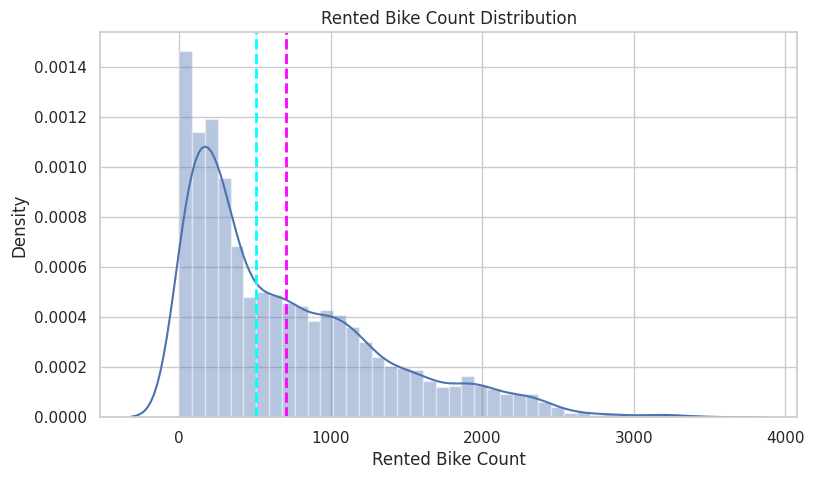

In [250]:

# Transform Your data
# Visualizing the distribution of the dependent variable - rental bike count
plt.figure(figsize=(9,5))
sns.distplot(bike_df[dependent_variable])
plt.xlabel('Rented Bike Count')
plt.title('Rented Bike Count Distribution')
plt.axvline(bike_df[dependent_variable[0]].mean(), color='magenta', linestyle='dashed', linewidth=2)
plt.axvline(bike_df[dependent_variable[0]].median(), color='cyan', linestyle='dashed', linewidth=2)
plt.show()

In [251]:
# Skew of the dependent variable
bike_df[dependent_variable].skew()

,0
rented_bike_count,1.153428


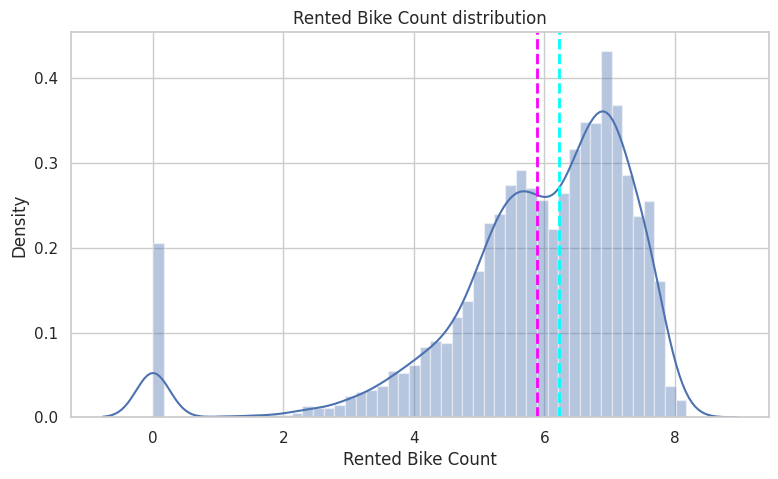

In [252]:
# Visualizing the distribution of dependent variable after log transformation
plt.figure(figsize=(9,5))
sns.distplot(np.log1p(bike_df[dependent_variable]))
plt.xlabel('Rented Bike Count')
plt.title('Rented Bike Count distribution')
plt.axvline(np.log1p(bike_df['rented_bike_count']).mean(), color='magenta', linestyle='dashed', linewidth=2)
plt.axvline(np.log1p(bike_df['rented_bike_count']).median(), color='cyan', linestyle='dashed', linewidth=2)
plt.show()

In [253]:
# Skew of the dependent variable after log transformation
np.log1p(bike_df[dependent_variable]).skew()

,0
rented_bike_count,-1.832199


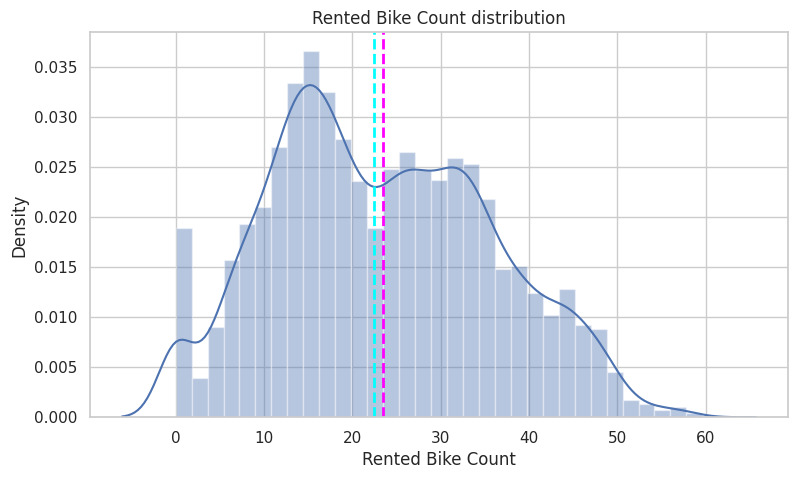

In [254]:
# Visualizing the distribution of dependent variable after sqrt transformation
plt.figure(figsize=(9,5))
sns.distplot(np.sqrt(bike_df[dependent_variable]))
plt.xlabel('Rented Bike Count')
plt.title('Rented Bike Count distribution')
plt.axvline(np.sqrt(bike_df['rented_bike_count']).mean(), color='magenta', linestyle='dashed', linewidth=2)
plt.axvline(np.sqrt(bike_df['rented_bike_count']).median(), color='cyan', linestyle='dashed', linewidth=2)
plt.show()

In [256]:
# Skew of the dependent variable after sqrt transformation
np.sqrt(bike_df[dependent_variable]).skew()

,0
rented_bike_count,0.237362


In [257]:

# Defining dependent and independent variables
X = bike_df.drop('rented_bike_count',axis=1)
y = np.sqrt(bike_df[dependent_variable])

In [258]:
features

['humidity',
 'wind_speed',
 'solar_radiation',
 'rainfall',
 'snowfall',
 'seasons',
 'holiday',
 'functioning_day',
 'day',
 'year',
 'hour_0',
 'hour_1',
 'hour_2',
 'hour_3',
 'hour_4',
 'hour_5',
 'hour_6',
 'hour_7',
 'hour_8',
 'hour_9',
 'hour_10',
 'hour_11',
 'hour_12',
 'hour_13',
 'hour_14',
 'hour_15',
 'hour_16',
 'hour_17',
 'hour_18',
 'hour_19',
 'hour_20',
 'hour_21',
 'hour_22',
 'hour_23',
 'visibility_0',
 'visibility_1',
 'visibility_2',
 'month_1',
 'month_2',
 'month_3',
 'month_4',
 'month_5',
 'month_6',
 'month_7',
 'month_8',
 'month_9',
 'month_10',
 'month_11',
 'month_12',
 'weekday_Friday',
 'weekday_Monday',
 'weekday_Saturday',
 'weekday_Sunday',
 'weekday_Thursday',
 'weekday_Tuesday',
 'weekday_Wednesday',
 'temp']

I have ploted distribution plot and also i did normality test and i have found that the data is not normally distributed, it needs transformation.

So, first i have calculate the skewness value and i have found that the rented bike attribute is positively skewed so i used log transfomation but it affected negatively.

So, i finally used square root transformation & now the data looks normally distrubuted & skewness is also reduced.

### 6. Data Scaling

In [260]:
features = [i for i in bike_df.columns if i not in ['rented_bike_count']]

In [262]:

# Scaling your data
scaler = StandardScaler()
X = scaler.fit_transform(bike_df[features])

##### Which method have you used to scale you data and why?



In this i have different independent features of different scale so i have used standard scalar method to scale our independent features into one scale.

### 7. Dimesionality Reduction

In [263]:
# Processed Dataset shape (rows, columns)
bike_df.shape

(8760, 57)

##### Do you think that dimensionality reduction is needed? Explain Why?

With 57 columns (independent features) and 8760 rows, and after doing all the feature engineering steps like removing multicolinearity, feature selection manupulations etc. I don't think I need dimensionality reduction here.

Essentially where high dimensions are a problem or where it is a particular point in the algorithm to dimension reduction.

In [ ]:
# DImensionality Reduction (If needed)
# NO

### 8. Data Splitting

In [264]:
# Split your data to train and test. Choose Splitting ratio wisely.
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size = 0.2, random_state = 0)

##### What data splitting ratio have you used and why?

To train the model i have split the data into train and test using train_test_split method.

There are two competing concerns: with less training data, your parameter estimates have greater variance. With less testing data, your performance statistic will have greater variance. Broadly speaking you should be concerned with dividing data such that neither variance is too high, which is more to do with the absolute number of instances in each category rather than the percentage.

If we have a total of 100 instances, we should probably stick with cross validation as no single split is going to give you satisfactory variance in our estimates. If we have 100,000 instances, it doesn't really matter whether we choose an 80:20 split or a 90:10 split.

It is surprising to find out that 80/20 is quite a commonly occurring ratio, often referred to as the Pareto principle.

So, in this case i have split 80% of the data into train and 20% into test.

### 9. Handling Imbalanced Dataset

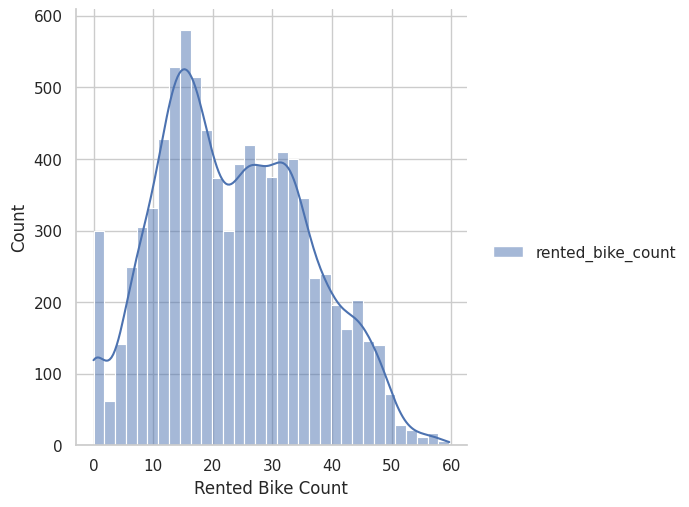

In [265]:
# Distribution of Rented Bike Count (target variable)
_ = sns.displot(y, kde=True)
plt.xlabel('Rented Bike Count')
plt.show()

##### Do you think the dataset is imbalanced? Explain Why.

Looking at the distribution of traget variable (i.e., Rented Bike Count), values are not concentrated in a narrow range, and is normally distributed accross wide range of values. So the dataset is not imbalanced.

## ***7. ML Model Implementation***

### ML Model - 1 Linear Regression

In [266]:
# Defining a function to print evaluation matrix
def evaluate_model(model, y_test, y_pred):

  '''takes model, y test and y pred values to print evaluation metrics, plot the actual and predicted values,
  plot the top 20 important features, and returns a list of the model scores'''

  # Squring the y test and and pred as we have used sqrt transformation
  y_t = np.square(y_test)
  y_p = np.square(y_pred)
  y_train2 = np.square(y_train)
  y_train_pred = np.square(model.predict(X_train))

  # Calculating Evaluation Matrix
  mse = mean_squared_error(y_t,y_p)
  rmse = np.sqrt(mse)
  mae = mean_absolute_error(y_t,y_p)
  r2_train = r2_score(y_train2, y_train_pred)
  r2 = r2_score(y_t,y_p)
  r2_adjusted = 1-(1-r2)*((len(X_test)-1)/(len(X_test)-X_test.shape[1]-1))

 # Printing Evaluation Matrix
  print("MSE :" , mse)
  print("RMSE :" ,rmse)
  print("MAE :" ,mae)
  print("Train R2 :" ,r2_train)
  print("Test R2 :" ,r2)
  print("Adjusted R2 : ", r2_adjusted)


  # plot actual and predicted values
  plt.figure(figsize=(13,4))
  plt.plot((y_p)[:100])
  plt.plot((np.array(y_t)[:100]))
  plt.legend(["Predicted","Actual"])
  plt.title('Actual and Predicted Bike Count', fontsize=15)

  try:
    importance = model.feature_importances_
  except:
    importance = model.coef_
  importance = np.absolute(importance)
  if len(importance)==len(features):
    pass
  else:
    importance = importance[0]

  # Feature importances
  feat = pd.Series(importance, index=features)
  plt.figure(figsize=(9,7))
  plt.title('Feature Importances (top 20) for '+str(model), fontsize = 15)
  plt.xlabel('Relative Importance')
  feat.nlargest(20).plot(kind='barh')


  model_score = [mse,rmse,mae,r2_train,r2,r2_adjusted]
  return model_score

In [267]:
# Create a score dataframe
score = pd.DataFrame(index = ['MSE', 'RMSE', 'MAE', 'Train R2', 'Test R2', 'Adjusted R2'])

In [268]:
# Import the LinearRegression class
reg = LinearRegression()

# Fit the linear regression model to the training data
reg.fit(X_train, y_train)

# Predict on the model
y_pred_li = reg.predict(X_test)

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

MSE : 88104.46944621409
RMSE : 296.8239704710758
MAE : 201.5999676697066
Train R2 : 0.7839600319566333
Test R2 : 0.7894869431741013
Adjusted R2 :  0.7825319395267559


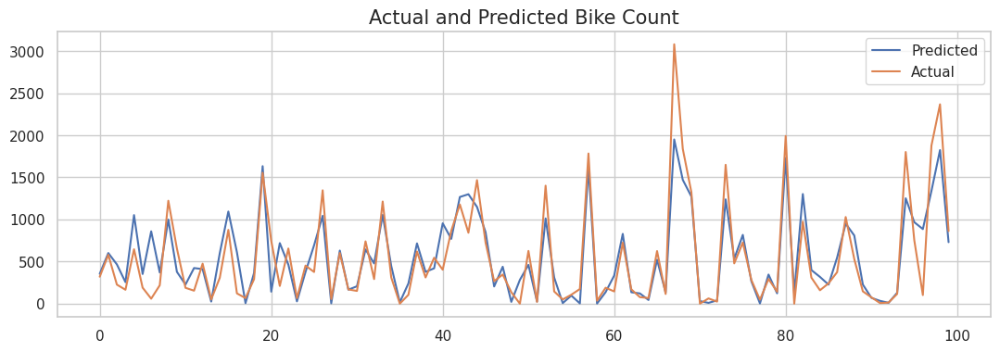

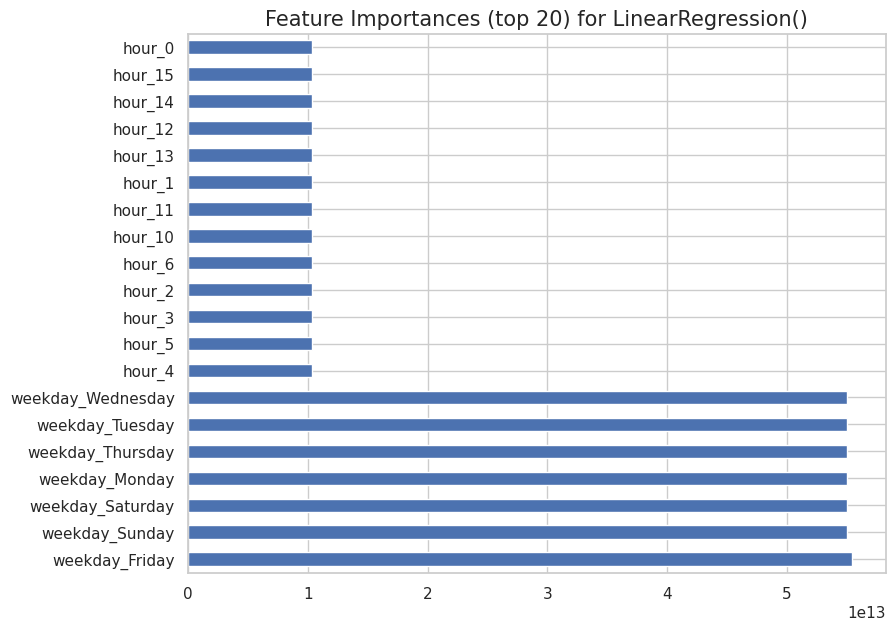

In [269]:
# Visualizing evaluation Metric Score chart
linear_score = evaluate_model(reg, y_test,y_pred_li)
# Evaluation Metric Score chart
score['Linear regression'] = linear_score

In [270]:
score

,Linear regression
MSE,88104.469446
RMSE,296.823970
MAE,201.599968
Train R2,0.783960
Test R2,0.789487
Adjusted R2,0.782532


#### 2. Cross- Validation & Hyperparameter Tuning

In [271]:

# Define the model
reg = LinearRegression()

# Define the parameters to be optimized
param_grid = {'fit_intercept': [True, False]}

# Perform grid search
grid_search = GridSearchCV(reg, param_grid, cv=5, scoring='r2', return_train_score=True)
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=LinearRegression(),
             param_grid={'fit_intercept': [True, False]},
             return_train_score=True, scoring='r2')

In [272]:

# Print the best parameters and the corresponding score
print("Best parameters: ", grid_search.best_params_)
print("Best R2 score: ", grid_search.best_score_)


Best parameters:  {'fit_intercept': False}
Best R2 score:  0.8032610375243057


In [273]:
# Use the best parameter to train the model
best_reg = grid_search.best_estimator_
best_reg.fit(X_train, y_train)


LinearRegression(fit_intercept=False)

In [274]:
# Predict on test data
y_pred_li2 = best_reg.predict(X_test)

MSE : 88293.28471914121
RMSE : 297.1418595875398
MAE : 201.64979447458433
Train R2 : 0.7838367078359518
Test R2 : 0.7890357960242559
Adjusted R2 :  0.7820658872203374


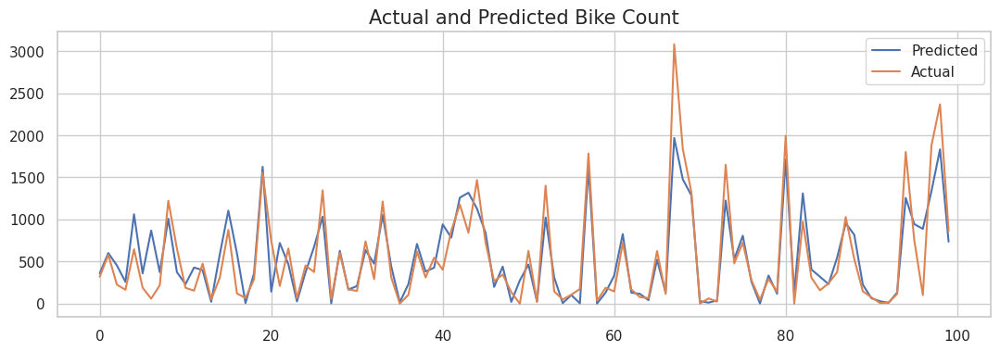

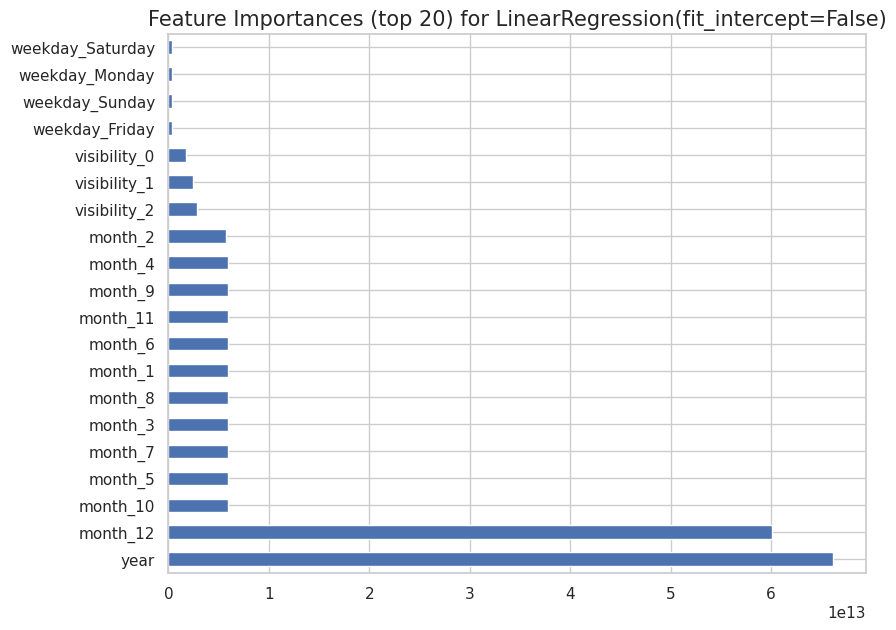

In [275]:
# Visualizing evaluation Metric Score chart
linear_score2 = evaluate_model(best_reg, y_test,y_pred_li2)

In [276]:
score['Linear regression tuned'] = linear_score2
score

,Linear regression,Linear regression tuned
MSE,88104.469446,88293.284719
RMSE,296.823970,297.141860
MAE,201.599968,201.649794
Train R2,0.783960,0.783837
Test R2,0.789487,0.789036
Adjusted R2,0.782532,0.782066


##### Which hyperparameter optimization technique have you used and why?

GridSearchCV is used to find the best hyperparameters for a machine learning model by searching over a specified parameter grid. It helps to ensure that a model is not overfitting or underfitting by evaluating the model's performance using cross-validation techniques. GridSearchCV can save time and resources compared to manually tuning the parameters of a model.

To reduce time and effort i have used GridSearchCV.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

For Both training and testing data, no improvement is seen.

### ML Model - 2 Lasso Regression

In [277]:
# Import the Lasso Regression class
lasso = Lasso()

# Fit the lasso regression model to your training data
lasso.fit(X_train, y_train)

# Predict on the model
y_pred_lasso1 = lasso.predict(X_test)

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

MSE : 199251.3913163066
RMSE : 446.3758408743764
MAE : 303.7585075968713
Train R2 : 0.5201233972729744
Test R2 : 0.5239172345460229
Adjusted R2 :  0.5081882464248295


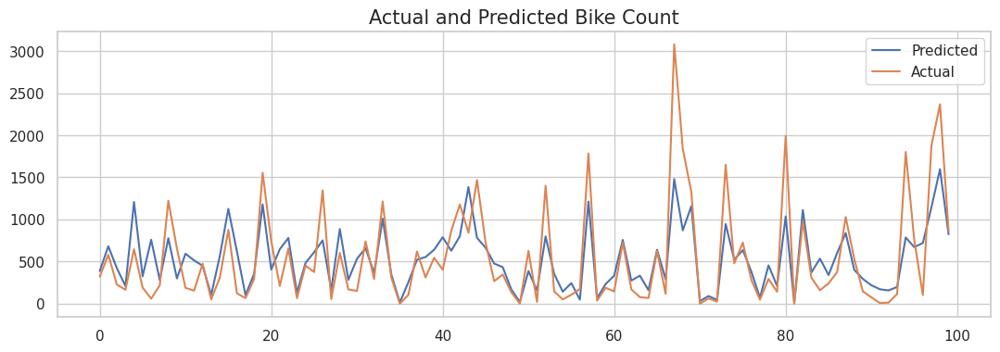

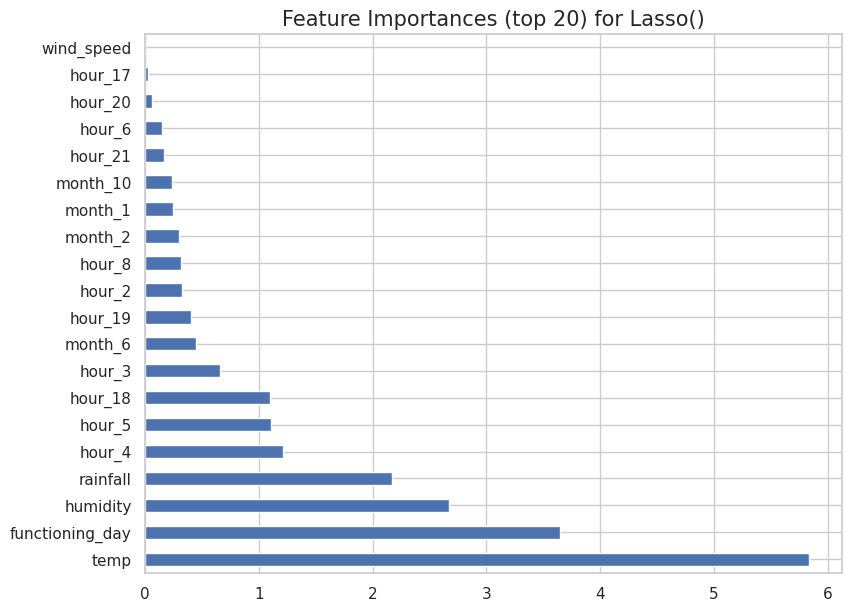

In [278]:
# Visualizing evaluation Metric Score chart
lasso_score = evaluate_model(lasso, y_test,y_pred_lasso1)
score['Lasso regression'] = lasso_score

In [279]:
score


,Linear regression,Linear regression tuned,Lasso regression
MSE,88104.469446,88293.284719,199251.391316
RMSE,296.823970,297.141860,446.375841
MAE,201.599968,201.649794,303.758508
Train R2,0.783960,0.783837,0.520123
Test R2,0.789487,0.789036,0.523917
Adjusted R2,0.782532,0.782066,0.508188


It is seen that using Lasso regression analysis the performance of the model has drop down. So i will try to tuned the model.



#### 2. Cross- Validation & Hyperparameter Tuning

In [280]:
# Define the model
lasso = Lasso()

# Define the parameters to be optimized & Perform grid search
parameters = {'alpha': [1e-15,1e-10,1e-8,1e-5,1e-4,1e-3,1e-2,1,5,10,20,30,40,45,50,55,60,100]}
lasso_regressor = GridSearchCV(lasso, parameters, scoring='neg_mean_squared_error', cv=5)

# Fitting model
lasso_regressor.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [1e-15, 1e-10, 1e-08, 1e-05, 0.0001, 0.001,
                                   0.01, 1, 5, 10, 20, 30, 40, 45, 50, 55, 60,
                                   100]},
             scoring='neg_mean_squared_error')

In [281]:
# Getting optimum parameters
print("The optimum alpha value is found out to be :" ,lasso_regressor.best_params_)
print("\nUsing ",lasso_regressor.best_params_, " the negative mean squared error is: ", lasso_regressor.best_score_)

The optimum alpha value is found out to be : {'alpha': 0.001}

Using  {'alpha': 0.001}  the negative mean squared error is:  -30.34058936916445


In [282]:
# Import the Lasso Regression class with best alpha
lasso = Lasso(alpha = lasso_regressor.best_params_['alpha'])

# Fit the lasso regression model to your training data
lasso.fit(X_train, y_train)

# Predict the model
y_pred_lassocv = lasso.predict(X_test)

MSE : 88412.1859938047
RMSE : 297.34186720642737
MAE : 201.7258089171736
Train R2 : 0.7834475991482606
Test R2 : 0.78875169839621
Adjusted R2 :  0.7817724034759668


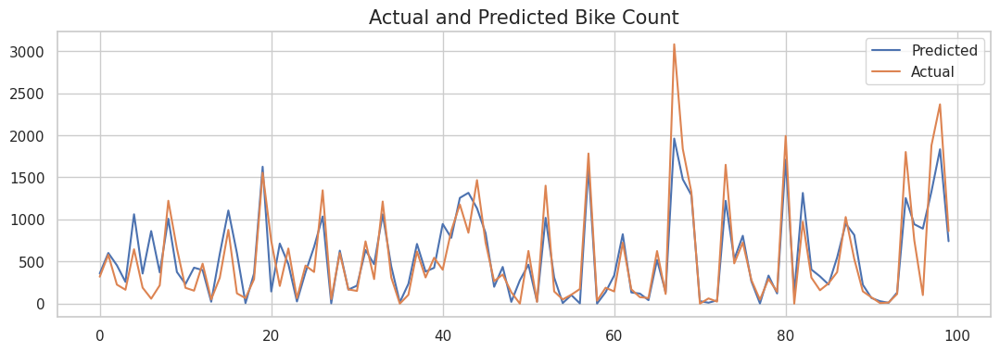

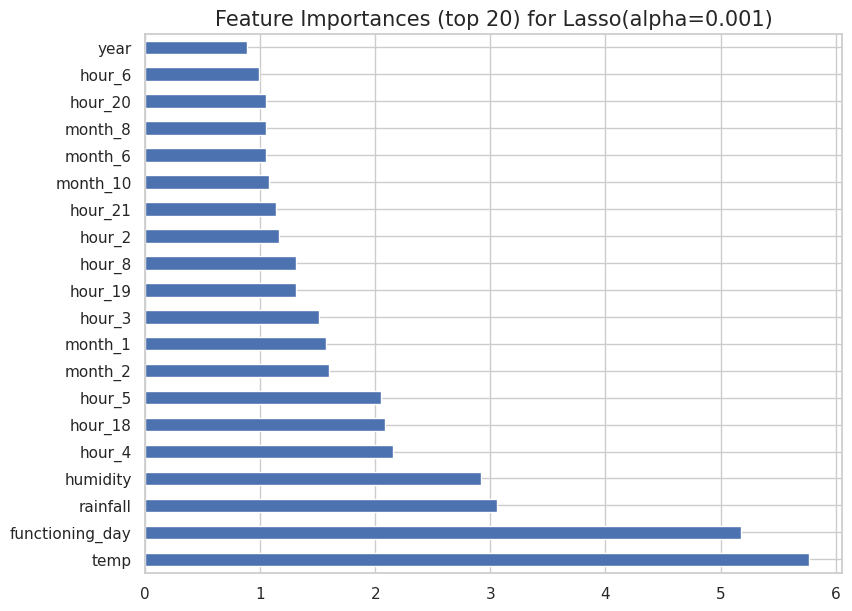

In [283]:
#Evaluation matrices for Lasso regression
lasso2 = evaluate_model(lasso, y_test,y_pred_lassocv)

name = 'Lasso with alpha = ' + str(lasso_regressor.best_params_['alpha'])

score[name] = lasso2

##### Which hyperparameter optimization technique have you used and why?

GridSearchCV is used to find the best hyperparameters for a machine learning model by searching over a specified parameter grid. It helps to ensure that a model is not overfitting or underfitting by evaluating the model's performance using cross-validation techniques. GridSearchCV can save time and resources compared to manually tuning the parameters of a model.

To reduce time and effort i have used GridSearchCV.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

In [284]:

score

,Linear regression,Linear regression tuned,Lasso regression,Lasso with alpha = 0.001
MSE,88104.469446,88293.284719,199251.391316,88412.185994
RMSE,296.823970,297.141860,446.375841,297.341867
MAE,201.599968,201.649794,303.758508,201.725809
Train R2,0.783960,0.783837,0.520123,0.783448
Test R2,0.789487,0.789036,0.523917,0.788752
Adjusted R2,0.782532,0.782066,0.508188,0.781772


After tuning i have seen that there is increse in performance from 52% to 78%

#### 3. Explain each evaluation metric's indication towards business and the business impact pf the ML model used.

RMSE & MSE are measuring the average squared values between the predicted and actual values.

Whereas R2 score is measure how well the model fits the data.

In a business context, a low RMSE and high R2 score would indicate that the model is making accurate predictions and is a good fit for the data. This would be desirable for a business because it would mean that the model is able to provide useful insights and make accurate predictions about future outcomes.

### ML Model - 3 Ridge Regression





In [286]:
# Ridge regressor class
ridge = Ridge()

# Fit the ridge regression model to your training data
ridge.fit(X_train, y_train)

# Predict on the model
y_pred_ridge1 = ridge.predict(X_test)

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

MSE : 88366.24494247747
RMSE : 297.26460425432
MAE : 201.69158198267345
Train R2 : 0.7835483502612199
Test R2 : 0.7888614679823556
Adjusted R2 :  0.7818857996679083


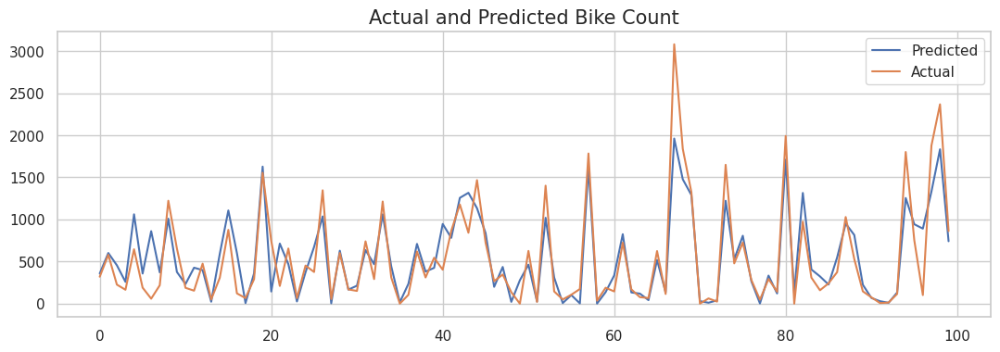

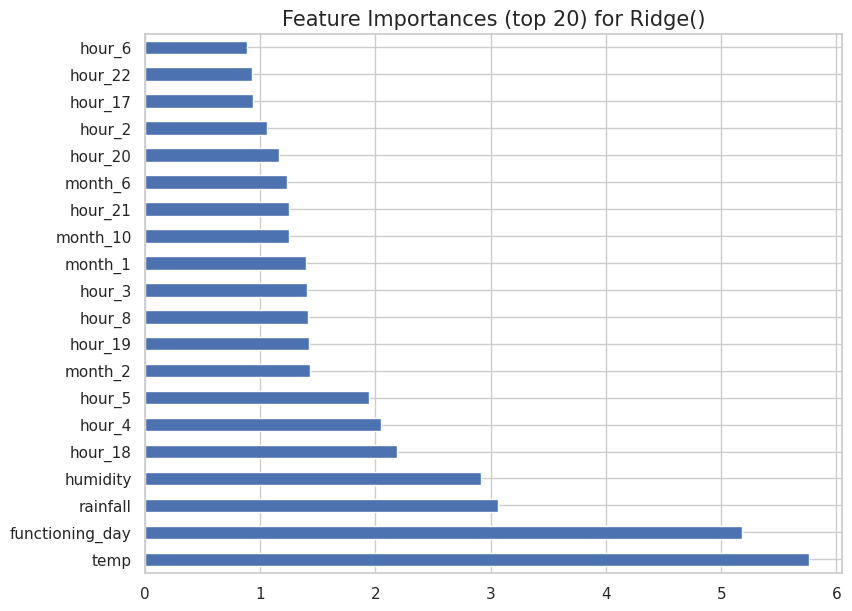

In [287]:
# Visualizing evaluation Metric Score chart
result = evaluate_model(ridge, y_test,y_pred_ridge1)
score['Ridge'] = result

In [288]:

score

,Linear regression,Linear regression tuned,Lasso regression,Lasso with alpha = 0.001,Ridge
MSE,88104.469446,88293.284719,199251.391316,88412.185994,88366.244942
RMSE,296.823970,297.141860,446.375841,297.341867,297.264604
MAE,201.599968,201.649794,303.758508,201.725809,201.691582
Train R2,0.783960,0.783837,0.520123,0.783448,0.783548
Test R2,0.789487,0.789036,0.523917,0.788752,0.788861
Adjusted R2,0.782532,0.782066,0.508188,0.781772,0.781886


I have used Ridge regression technique to check the performance of the model and i have found that there is no significant difference in between linear regression and Ridge.

#### 2. Cross- Validation & Hyperparameter Tuning

In [289]:

# Import Ridge regressor Class
ridge = Ridge()

# Define the parameters to be optimized & Perform grid search
parameters = {'alpha': [1e-15,1e-10,1e-8,1e-5,1e-4,1e-3,1e-2,1,5,10,20,30,40,45,50,55,60,100]}
ridge_regressor = GridSearchCV(ridge, parameters, scoring='neg_mean_squared_error', cv=5)

# Fitting model
ridge_regressor.fit(X_train,y_train)


GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [1e-15, 1e-10, 1e-08, 1e-05, 0.0001, 0.001,
                                   0.01, 1, 5, 10, 20, 30, 40, 45, 50, 55, 60,
                                   100]},
             scoring='neg_mean_squared_error')

In [290]:
# Getting optimum parameters
print("The best fit alpha value is found out to be :" ,ridge_regressor.best_params_)
print("\nUsing ",ridge_regressor.best_params_, " the negative mean squared error is: ", ridge_regressor.best_score_)


The best fit alpha value is found out to be : {'alpha': 5}

Using  {'alpha': 5}  the negative mean squared error is:  -30.340187117910574


In [291]:

# Initiate ridge with best alpha
ridge = Ridge(alpha = ridge_regressor.best_params_['alpha'])

# Fit the ridge regression model to your training data
ridge.fit(X_train, y_train)

# Predict on model
y_pred_ridge = ridge.predict(X_test)

MSE : 88416.54082619368
RMSE : 297.3491900547127
MAE : 201.7574335673151
Train R2 : 0.7834421786158956
Test R2 : 0.7887412931456713
Adjusted R2 :  0.7817616544531389


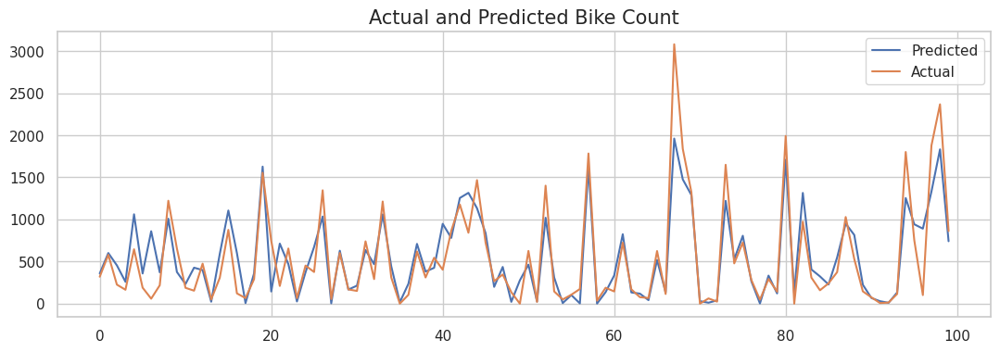

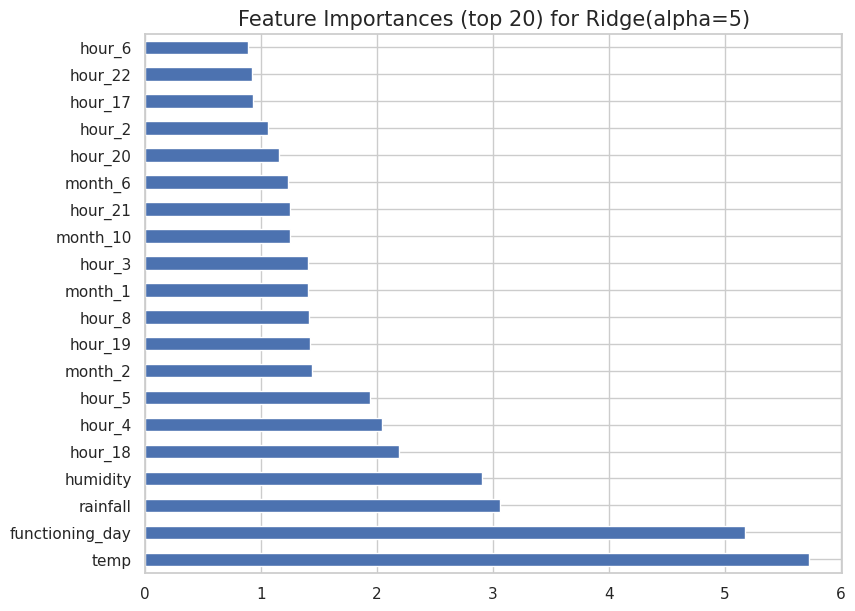

In [292]:

# Evaluation matrices for Ridge regression
result = evaluate_model(ridge, y_test,y_pred_ridge)

namer = 'Ridge with alpha = ' + str(ridge_regressor.best_params_['alpha'])

score[namer] = result

##### Which hyperparameter optimization technique have you used and why?

GridSearchCV is used to find the best hyperparameters for a machine learning model by searching over a specified parameter grid. It helps to ensure that a model is not overfitting or underfitting by evaluating the model's performance using cross-validation techniques. GridSearchCV can save time and resources compared to manually tuning the parameters of a model.

To reduce time and effort we have used GridSearchCV.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

In [293]:
score

,Linear regression,Linear regression tuned,Lasso regression,Lasso with alpha = 0.001,Ridge,Ridge with alpha = 5
MSE,88104.469446,88293.284719,199251.391316,88412.185994,88366.244942,88416.540826
RMSE,296.823970,297.141860,446.375841,297.341867,297.264604,297.349190
MAE,201.599968,201.649794,303.758508,201.725809,201.691582,201.757434
Train R2,0.783960,0.783837,0.520123,0.783448,0.783548,0.783442
Test R2,0.789487,0.789036,0.523917,0.788752,0.788861,0.788741
Adjusted R2,0.782532,0.782066,0.508188,0.781772,0.781886,0.781762


I have tuned Ridge regression using hyperparametric technique & check the performance of the model and i have found that there is no significant difference in between tuned and without tuned.

It performs well only when there is multicollinearity or overfitting situation is present in our case we have already handle the multicollinearity situation, thats why it is not showing any difference in performance.



### ML Model - 4 : Decision Tree





In [294]:
# Import Decision Tree Regressor class
dt = DecisionTreeRegressor(random_state=1)

# Fit the Decision Tree model to your training data
dt.fit(X_train,y_train)

# Predict on the model
y_pred_dt1 = dt.predict(X_test)

### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.


MSE : 69443.33047945205
RMSE : 263.52102473892296
MAE : 149.09417808219177
Train R2 : 1.0
Test R2 : 0.8340750717042229
Adjusted R2 :  0.8285931861676072


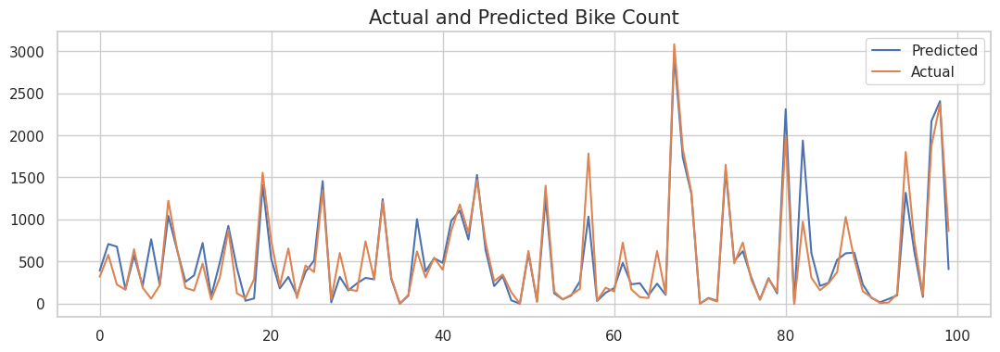

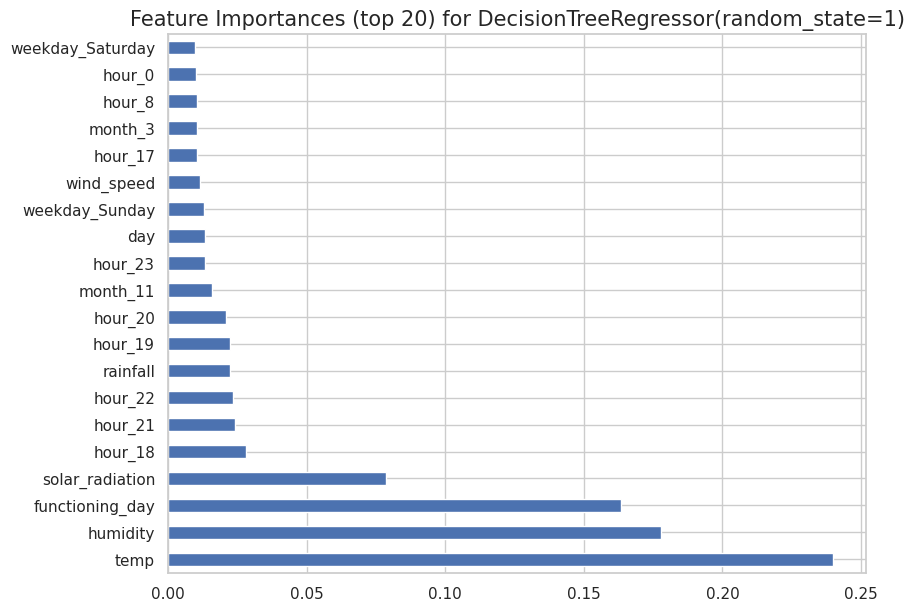

In [295]:

# Visualizing evaluation Metric Score chart
result = evaluate_model(dt, y_test,y_pred_dt1)
score['Decision tree'] = result

In [296]:

score

,Linear regression,Linear regression tuned,Lasso regression,Lasso with alpha = 0.001,Ridge,Ridge with alpha = 5,Decision tree
MSE,88104.469446,88293.284719,199251.391316,88412.185994,88366.244942,88416.540826,69443.330479
RMSE,296.823970,297.141860,446.375841,297.341867,297.264604,297.349190,263.521025
MAE,201.599968,201.649794,303.758508,201.725809,201.691582,201.757434,149.094178
Train R2,0.783960,0.783837,0.520123,0.783448,0.783548,0.783442,1.000000
Test R2,0.789487,0.789036,0.523917,0.788752,0.788861,0.788741,0.834075
Adjusted R2,0.782532,0.782066,0.508188,0.781772,0.781886,0.781762,0.828593


From the decision tree algorithm i got train R2 score is 1 and test R2 score is 83% which shows the overfitting condition on train dataset.

So, i have decided to tune the data using GridSearchCV

## 2. Cross- Validation & Hyperparameter Tuning

In [297]:

# Regressor
dt_model = DecisionTreeRegressor(random_state=1)

# Hyperparameter Grid
grid = {'max_depth' : [8,10,12,14,16],
        'min_samples_split' : np.arange(35,50),
        'min_samples_leaf' : np.arange(22,31,2)}

# Fitting model with hypertuned paramaters using grid search
dt_gridsearch = GridSearchCV(dt_model,
                             grid,
                             cv=6,
                             scoring= 'neg_root_mean_squared_error')
dt_gridsearch.fit(X_train,y_train)
dt_best_params = dt_gridsearch.best_params_

In [298]:
dt_best_params

{'max_depth': 16, 'min_samples_leaf': 22, 'min_samples_split': 35}

In [299]:
# Building Decision Tree model with best parameters
dt_model = DecisionTreeRegressor(max_depth=dt_best_params['max_depth'],
                                 min_samples_leaf=dt_best_params['min_samples_leaf'],
                                 min_samples_split=dt_best_params['min_samples_split'],
                                 random_state=1)

In [300]:
# Fitting model
dt_model.fit(X_train,y_train)

DecisionTreeRegressor(max_depth=16, min_samples_leaf=22, min_samples_split=35,
                      random_state=1)

In [301]:

# Predict on the model
y_pred_dt = dt_model.predict(X_test)

MSE : 90340.44416838442
RMSE : 300.56687137538034
MAE : 185.66074997946106
Train R2 : 0.8366527846659124
Test R2 : 0.7841444006594236
Adjusted R2 :  0.7770128882328322


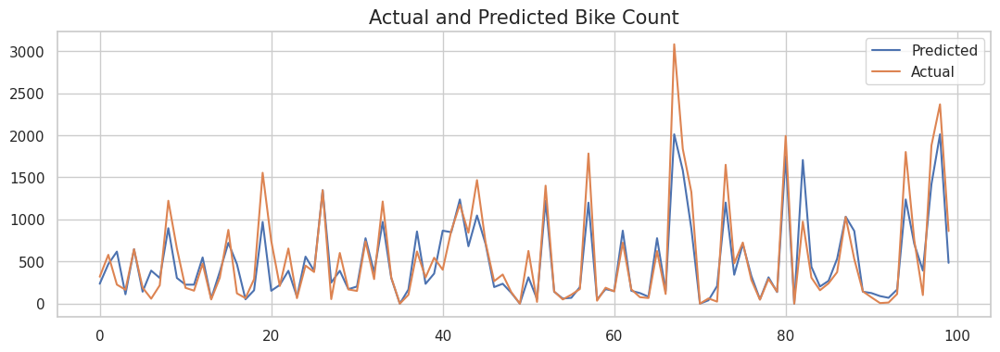

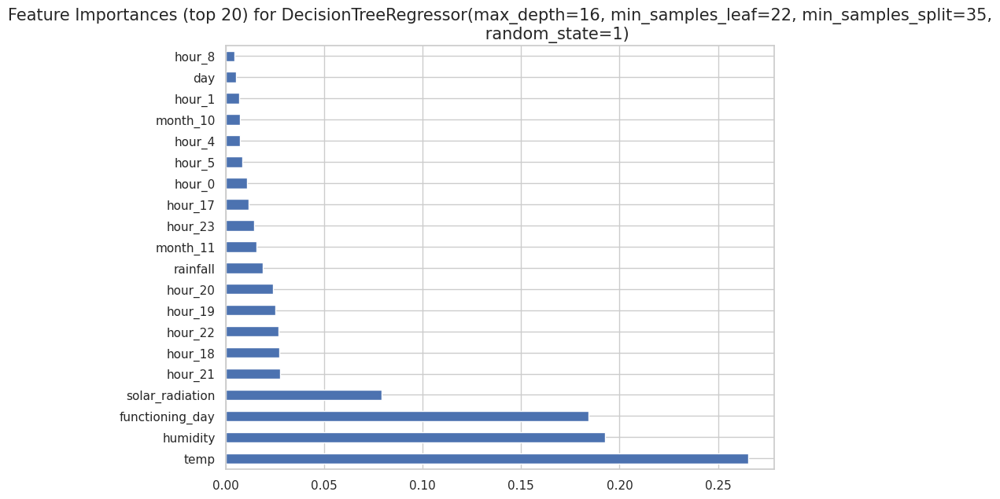

In [302]:

# Evaluation matrices for DecisionTree
result = evaluate_model(dt_model, y_test,y_pred_dt)
score['Decision tree tuned'] = result

#### Which hyperparameter optimization technique have you used and why?

GridSearchCV is used to find the best hyperparameters for a machine learning model by searching over a specified parameter grid. It helps to ensure that a model is not overfitting or underfitting by evaluating the model's performance using cross-validation techniques. GridSearchCV can save time and resources compared to manually tuning the parameters of a model.

To reduce time and effort we have used GridSearchCV.

###### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.


In [303]:
score

,Linear regression,Linear regression tuned,Lasso regression,Lasso with alpha = 0.001,Ridge,Ridge with alpha = 5,Decision tree,Decision tree tuned
MSE,88104.469446,88293.284719,199251.391316,88412.185994,88366.244942,88416.540826,69443.330479,90340.444168
RMSE,296.823970,297.141860,446.375841,297.341867,297.264604,297.349190,263.521025,300.566871
MAE,201.599968,201.649794,303.758508,201.725809,201.691582,201.757434,149.094178,185.660750
Train R2,0.783960,0.783837,0.520123,0.783448,0.783548,0.783442,1.000000,0.836653
Test R2,0.789487,0.789036,0.523917,0.788752,0.788861,0.788741,0.834075,0.784144
Adjusted R2,0.782532,0.782066,0.508188,0.781772,0.781886,0.781762,0.828593,0.777013


From the above tuned Decision tree regression, it has seen that earlier that we have faced overfitting condition. After tuning it there is no such condition and it looks like model performs with good accuracy around 83% on train and 78% on test data.



### ML Model - 5 : Random Forest

In [304]:
# Import Random Forest Regressor class
rf = RandomForestRegressor(random_state=0)

# Fit the Random Forest model to your training data
rf.fit(X_train,y_train)

# Predict on the model
y_pred_rf1 = rf.predict(X_test)


##### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.


MSE : 38426.74022431891
RMSE : 196.02739661669466
MAE : 111.41960977496545
Train R2 : 0.988055846941162
Test R2 : 0.9081847879077865
Adjusted R2 :  0.9051513649714065


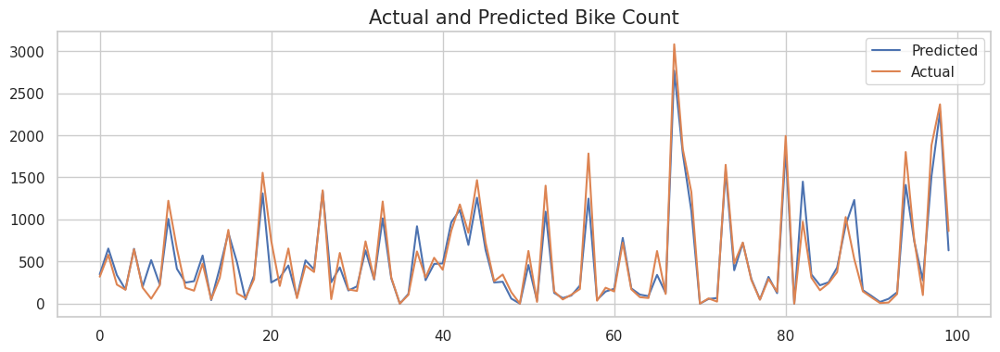

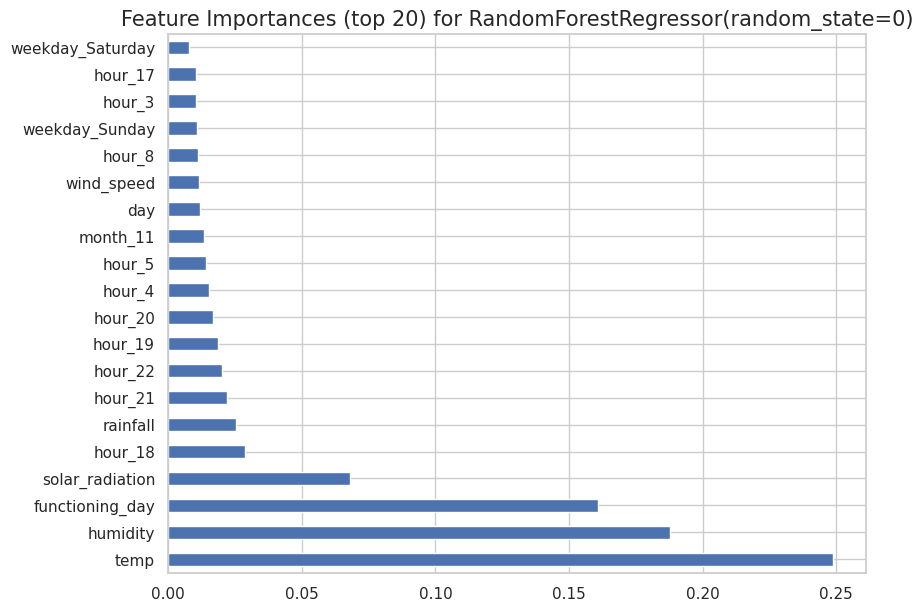

In [305]:
# Visualizing evaluation Metric Score chart
result = evaluate_model(rf, y_test,y_pred_rf1)
score['Random forest'] = result

In [306]:

score

,Linear regression,Linear regression tuned,Lasso regression,Lasso with alpha = 0.001,Ridge,Ridge with alpha = 5,Decision tree,Decision tree tuned,Random forest
MSE,88104.469446,88293.284719,199251.391316,88412.185994,88366.244942,88416.540826,69443.330479,90340.444168,38426.740224
RMSE,296.823970,297.141860,446.375841,297.341867,297.264604,297.349190,263.521025,300.566871,196.027397
MAE,201.599968,201.649794,303.758508,201.725809,201.691582,201.757434,149.094178,185.660750,111.419610
Train R2,0.783960,0.783837,0.520123,0.783448,0.783548,0.783442,1.000000,0.836653,0.988056
Test R2,0.789487,0.789036,0.523917,0.788752,0.788861,0.788741,0.834075,0.784144,0.908185
Adjusted R2,0.782532,0.782066,0.508188,0.781772,0.781886,0.781762,0.828593,0.777013,0.905151


Here i have seen that using random forest, regression accuracy of the train and test model increases 98% and 90% respectively, which seems to be a good model for prediction.

##### 2. Cross- Validation & Hyperparameter Tuning

In [307]:
# Random forest model
rf_model = RandomForestRegressor(random_state=0)
rf_params = {'n_estimators':[300],                    # limited due to computational power availability
             'min_samples_leaf':np.arange(20,25)}     # Approximate range from a decision tree model

In [308]:
# Fitting a Random Forest model with best parameters obtained from gridsearch
rf_gridsearch = GridSearchCV(rf_model,rf_params,cv=6,scoring='neg_root_mean_squared_error')
rf_gridsearch.fit(X_train,y_train)
rf_best_params = rf_gridsearch.best_params_

In [309]:

# Best parameters for random forests
rf_best_params


{'min_samples_leaf': 20, 'n_estimators': 300}

In [310]:

# Building Random Forest model with best parameters
rf_model = RandomForestRegressor(n_estimators=rf_best_params['n_estimators'],
                                 min_samples_leaf=rf_best_params['min_samples_leaf'],
                                 random_state=0)

In [311]:

# Fitting model
rf_model.fit(X_train,y_train)

RandomForestRegressor(min_samples_leaf=20, n_estimators=300, random_state=0)

In [312]:
# Predict on the model
y_pred_rf = rf_model.predict(X_test)

MSE : 75777.15864032366
RMSE : 275.2765130560972
MAE : 165.90980585974822
Train R2 : 0.8568866344787427
Test R2 : 0.8189412931804327
Adjusted R2 :  0.8129594126011432


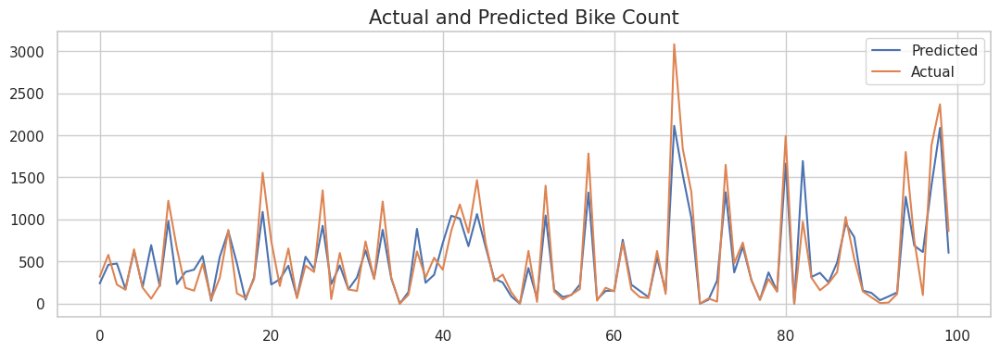

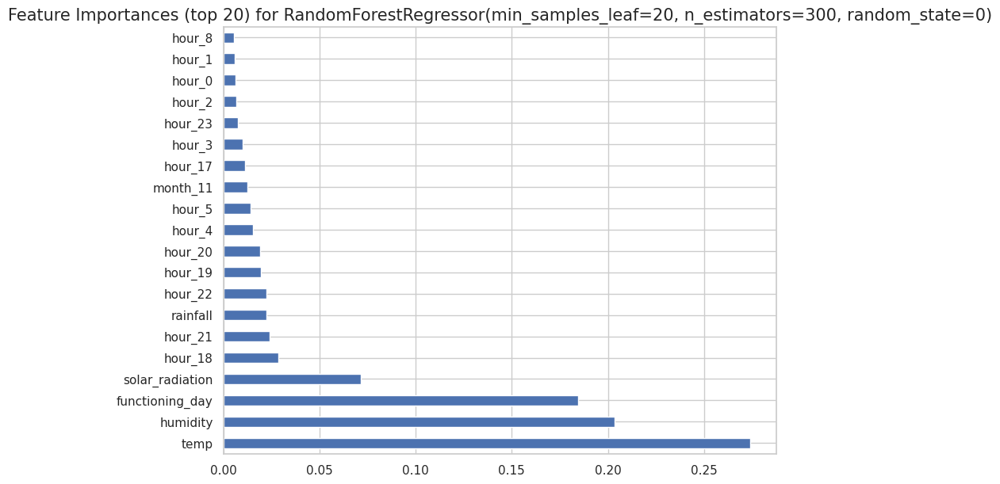

In [313]:
# Evaluation matrices for RandomForest
result = evaluate_model(rf_model, y_test,y_pred_rf)
score['Random forest tuned'] = result

##### Which hyperparameter optimization technique have you used and why?

GridSearchCV is used to find the best hyperparameters for a machine learning model by searching over a specified parameter grid. It helps to ensure that a model is not overfitting or underfitting by evaluating the model's performance using cross-validation techniques. GridSearchCV can save time and resources compared to manually tuning the parameters of a model.

To reduce time and effort we have used GridSearchCV.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.


In [314]:

score

,Linear regression,Linear regression tuned,Lasso regression,Lasso with alpha = 0.001,Ridge,Ridge with alpha = 5,Decision tree,Decision tree tuned,Random forest,Random forest tuned
MSE,88104.469446,88293.284719,199251.391316,88412.185994,88366.244942,88416.540826,69443.330479,90340.444168,38426.740224,75777.158640
RMSE,296.823970,297.141860,446.375841,297.341867,297.264604,297.349190,263.521025,300.566871,196.027397,275.276513
MAE,201.599968,201.649794,303.758508,201.725809,201.691582,201.757434,149.094178,185.660750,111.419610,165.909806
Train R2,0.783960,0.783837,0.520123,0.783448,0.783548,0.783442,1.000000,0.836653,0.988056,0.856887
Test R2,0.789487,0.789036,0.523917,0.788752,0.788861,0.788741,0.834075,0.784144,0.908185,0.818941
Adjusted R2,0.782532,0.782066,0.508188,0.781772,0.781886,0.781762,0.828593,0.777013,0.905151,0.812959


After tuning the random forest algorithm it has seen that there is drop in performance both in train and test score so i am not going to use this model.

### ML Model - 6 : Gradient Boosting Regressor

In [315]:
# Import Gradient Boosting Regressor class
gb = GradientBoostingRegressor(random_state=0)

# Fit the Gradient Boosting model to the training data
gb.fit(X_train,y_train)

# Predict on the model
y_pred_gb1 = gb.predict(X_test)

##### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.


MSE : 80141.72191402827
RMSE : 283.0931329333657
MAE : 188.68769678137278
Train R2 : 0.8217193294978934
Test R2 : 0.8085127920813084
Adjusted R2 :  0.8021863710527263


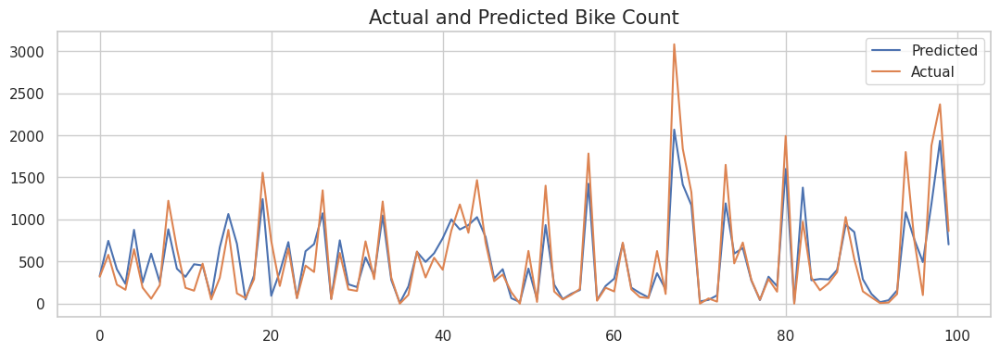

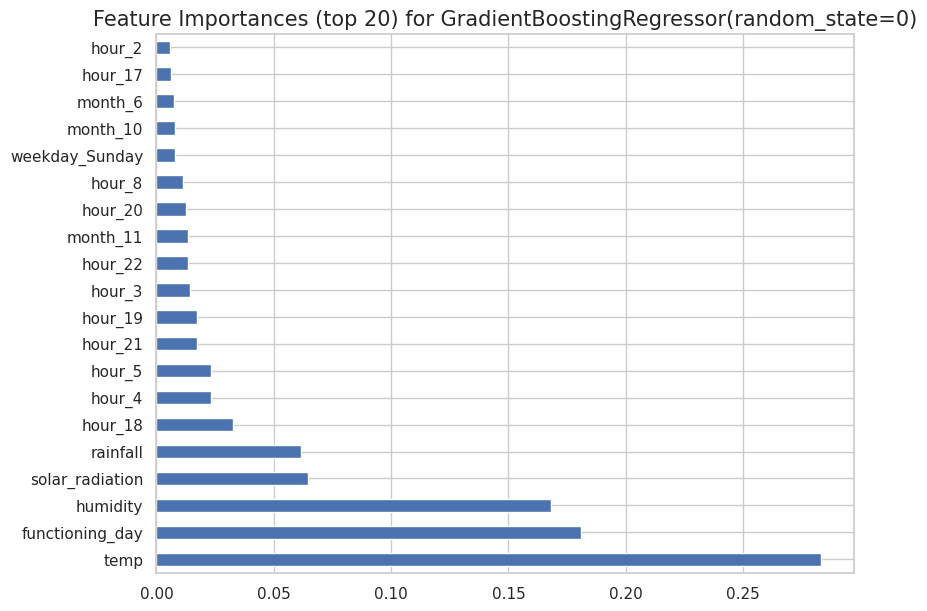

In [316]:

# Visualizing evaluation Metric Score chart
result = evaluate_model(gb, y_test,y_pred_gb1)
score['Gradient Boosting Regressor'] = result

In [317]:

score

,Linear regression,Linear regression tuned,Lasso regression,Lasso with alpha = 0.001,Ridge,Ridge with alpha = 5,Decision tree,Decision tree tuned,Random forest,Random forest tuned,Gradient Boosting Regressor
MSE,88104.469446,88293.284719,199251.391316,88412.185994,88366.244942,88416.540826,69443.330479,90340.444168,38426.740224,75777.158640,80141.721914
RMSE,296.823970,297.141860,446.375841,297.341867,297.264604,297.349190,263.521025,300.566871,196.027397,275.276513,283.093133
MAE,201.599968,201.649794,303.758508,201.725809,201.691582,201.757434,149.094178,185.660750,111.419610,165.909806,188.687697
Train R2,0.783960,0.783837,0.520123,0.783448,0.783548,0.783442,1.000000,0.836653,0.988056,0.856887,0.821719
Test R2,0.789487,0.789036,0.523917,0.788752,0.788861,0.788741,0.834075,0.784144,0.908185,0.818941,0.808513
Adjusted R2,0.782532,0.782066,0.508188,0.781772,0.781886,0.781762,0.828593,0.777013,0.905151,0.812959,0.802186


Using Gradient Boosting Regressor i have got low accuracy around 82% and 80% on train and test data respectively, which is less than random forest, decision tree algorithm.

##### 2. Cross- Validation & Hyperparameter Tuning

In [318]:

# Gradient Boosting Model
gb_model = GradientBoostingRegressor(random_state=0)
gb_params = {'n_estimators':[300],
             'min_samples_leaf':np.arange(20,24),
             'max_depth':np.arange(14,17)
             }


In [319]:
# Perform the randomized search
random_search = RandomizedSearchCV(gb_model, param_distributions=gb_params, cv=6, n_iter=20, scoring='neg_root_mean_squared_error', n_jobs=-1)
random_search.fit(X_train, y_train)

gb_best_params = random_search.best_params_

In [320]:

# Best parameters for Gradient Boosting Model
gb_best_params

{'n_estimators': 300, 'min_samples_leaf': 22, 'max_depth': 15}

In [321]:

# Building Gradient Boosting Model with best parameters
gb_model = GradientBoostingRegressor(n_estimators=gb_best_params['n_estimators'],
                                     min_samples_leaf=gb_best_params['min_samples_leaf'],
                                     max_depth = gb_best_params['max_depth'],
                                     random_state=0)

In [322]:

# Fitting model
gb_model.fit(X_train,y_train)

GradientBoostingRegressor(max_depth=15, min_samples_leaf=22, n_estimators=300,
                          random_state=0)

In [323]:
# Predict on the Model
y_pred_gb = gb_model.predict(X_test)

MSE : 26479.91130337119
RMSE : 162.72649232184412
MAE : 92.99144515661648
Train R2 : 0.9964090172575972
Test R2 : 0.9367300307465745
Adjusted R2 :  0.9346396954792047


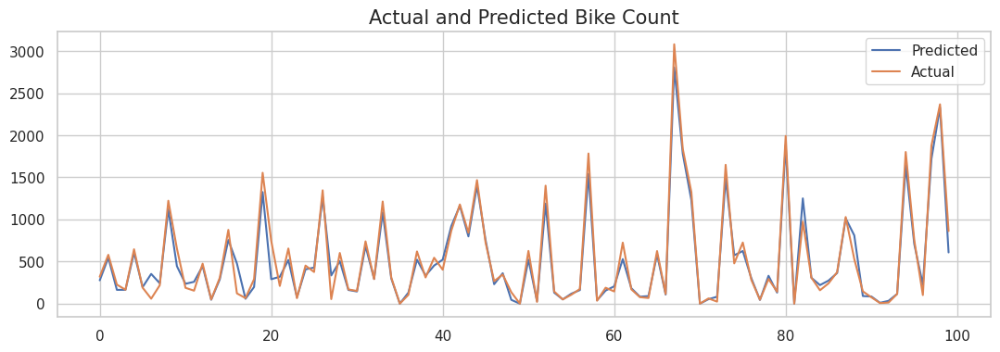

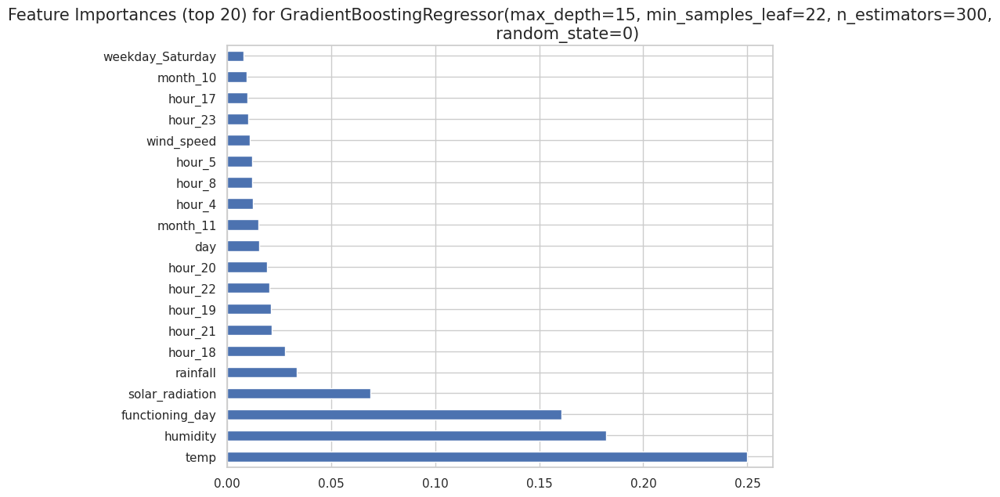

In [324]:
# Evaluation matrices for GradientBoosting
result = evaluate_model(gb_model, y_test,y_pred_gb)
score['Gradient Boosting Regressor Tuned'] = result

##### Which hyperparameter optimization technique have you used and why?

Randomized search cross-validation (CV) is used to efficiently explore the hyperparameter space of a machine learning model. It works by randomly sampling from the search space of hyperparameters, rather than exhaustively trying every possible combination. This allows for a more efficient search while still providing a good chance of finding good hyperparameter values. Additionally, by using cross-validation to evaluate the performance of each set of hyperparameters, one can ensure that the model is not overfitting to the training data.

Because of its randomly sampling technique and to save the time i have decided to use Randomized search CV.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.


In [325]:
score

,Linear regression,Linear regression tuned,Lasso regression,Lasso with alpha = 0.001,Ridge,Ridge with alpha = 5,Decision tree,Decision tree tuned,Random forest,Random forest tuned,Gradient Boosting Regressor,Gradient Boosting Regressor Tuned
MSE,88104.469446,88293.284719,199251.391316,88412.185994,88366.244942,88416.540826,69443.330479,90340.444168,38426.740224,75777.158640,80141.721914,26479.911303
RMSE,296.823970,297.141860,446.375841,297.341867,297.264604,297.349190,263.521025,300.566871,196.027397,275.276513,283.093133,162.726492
MAE,201.599968,201.649794,303.758508,201.725809,201.691582,201.757434,149.094178,185.660750,111.419610,165.909806,188.687697,92.991445
Train R2,0.783960,0.783837,0.520123,0.783448,0.783548,0.783442,1.000000,0.836653,0.988056,0.856887,0.821719,0.996409
Test R2,0.789487,0.789036,0.523917,0.788752,0.788861,0.788741,0.834075,0.784144,0.908185,0.818941,0.808513,0.936730
Adjusted R2,0.782532,0.782066,0.508188,0.781772,0.781886,0.781762,0.828593,0.777013,0.905151,0.812959,0.802186,0.934640


After using the Randomised search CV, the model performs very well it gave accuracy 99% on train data & 93% on test data which is very good model accuracy. But it is overfitting the model's training accuracy is almost 100%.

### ML Model - 7 : Extreme Gradient Boosting Regressor

In [328]:
from xgboost import XGBRegressor
import xgboost as xgb
# Import Extreme Gradient Boosting Regressor class
xgb_model = xgb.XGBRegressor(random_state=0,
                             objective='reg:squarederror')

# Fit the Extreme Gradient Boosting model to the training data
xgb_model.fit(X_train,y_train)

# Predict on the model
y_pred_xgb1 = xgb_model.predict(X_test)


##### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.


MSE : 29852.700136105075
RMSE : 172.77933943647625
MAE : 100.26211364318691
Train R2 : 0.9838732255292763
Test R2 : 0.9286712331433438
Adjusted R2 :  0.9263146485156313


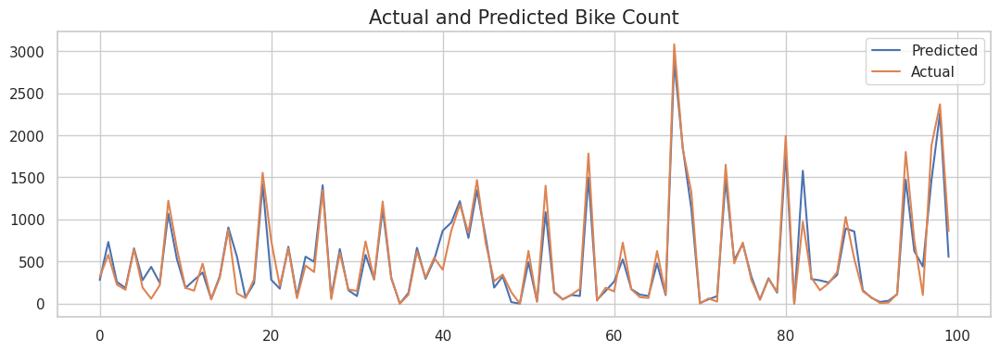

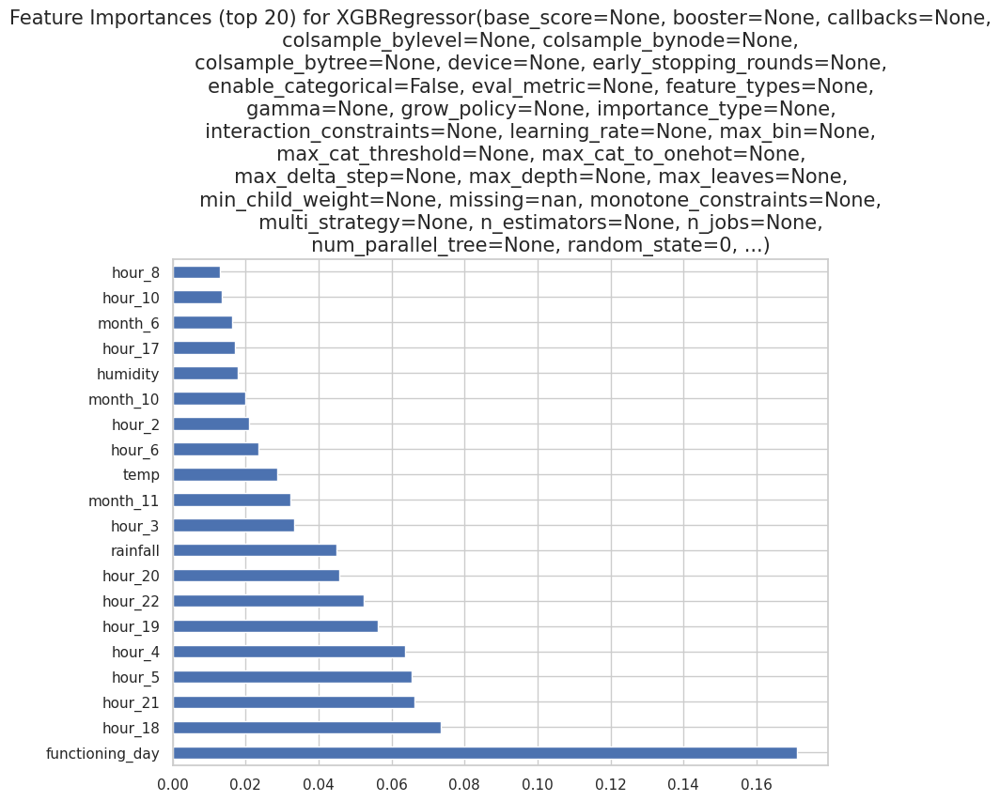

In [329]:

# Visualizing evaluation Metric Score chart
result = evaluate_model(xgb_model, y_test,y_pred_xgb1)
score['Extreme Gradient Boosting Regressor'] = result

In [330]:

score

,Linear regression,Linear regression tuned,Lasso regression,Lasso with alpha = 0.001,Ridge,Ridge with alpha = 5,Decision tree,Decision tree tuned,Random forest,Random forest tuned,Gradient Boosting Regressor,Gradient Boosting Regressor Tuned,Extreme Gradient Boosting Regressor
MSE,88104.469446,88293.284719,199251.391316,88412.185994,88366.244942,88416.540826,69443.330479,90340.444168,38426.740224,75777.158640,80141.721914,26479.911303,29852.700136
RMSE,296.823970,297.141860,446.375841,297.341867,297.264604,297.349190,263.521025,300.566871,196.027397,275.276513,283.093133,162.726492,172.779339
MAE,201.599968,201.649794,303.758508,201.725809,201.691582,201.757434,149.094178,185.660750,111.419610,165.909806,188.687697,92.991445,100.262114
Train R2,0.783960,0.783837,0.520123,0.783448,0.783548,0.783442,1.000000,0.836653,0.988056,0.856887,0.821719,0.996409,0.983873
Test R2,0.789487,0.789036,0.523917,0.788752,0.788861,0.788741,0.834075,0.784144,0.908185,0.818941,0.808513,0.936730,0.928671
Adjusted R2,0.782532,0.782066,0.508188,0.781772,0.781886,0.781762,0.828593,0.777013,0.905151,0.812959,0.802186,0.934640,0.926315


Using Extreme Gradient Boosting Regressor i have got accuracy around 98% and 92% on train and test data respectively, which is very good till now, than others algorithm.

So, lets tune it.

##### 2. Cross- Validation & Hyperparameter Tuning


In [331]:

# XG boost model
xgb_model = xgb.XGBRegressor(random_state=0,
                             objective='reg:squarederror')
xgb_params = {'n_estimators':[500],
             'min_samples_leaf':np.arange(20,22)}

In [332]:

# Perform the randomized search
xgb_search = RandomizedSearchCV(xgb_model,xgb_params,cv=6,scoring='neg_root_mean_squared_error',n_iter=100, n_jobs=-1)
xgb_search.fit(X_train,y_train)
xgb_best_params = xgb_search.best_params_

In [333]:

# Best parameters for XG boost Model
xgb_best_params

{'n_estimators': 500, 'min_samples_leaf': 20}

In [334]:
# Building a XG boost model with best parameters
xgb_model = xgb.XGBRegressor(n_estimators=xgb_best_params['n_estimators'],
                             min_samples_leaf=xgb_best_params['min_samples_leaf'],
                             random_state=0)


In [335]:
# Fitting model
xgb_model.fit(X_train,y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, min_samples_leaf=20, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=500,
             n_jobs=None, num_parallel_tree=None, ...)

In [336]:

# Predict on the model
y_pred_xgb = xgb_model.predict(X_test)

MSE : 26263.730018568887
RMSE : 162.06088367823028
MAE : 91.97564933558748
Train R2 : 0.9996022963130571
Test R2 : 0.937246565076539
Adjusted R2 :  0.9351732952501592


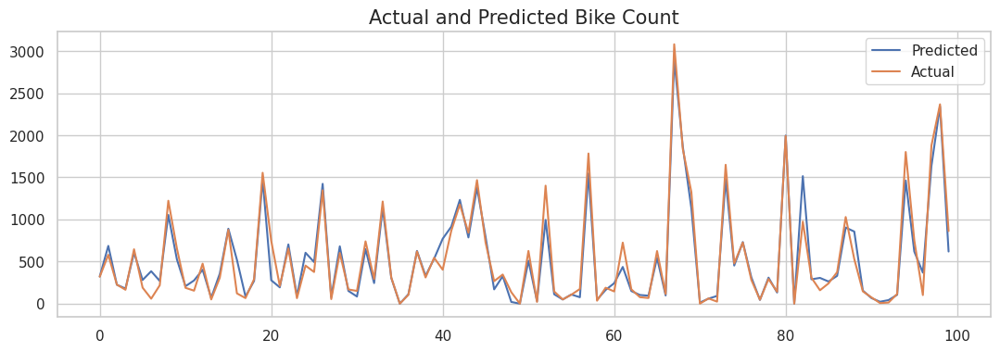

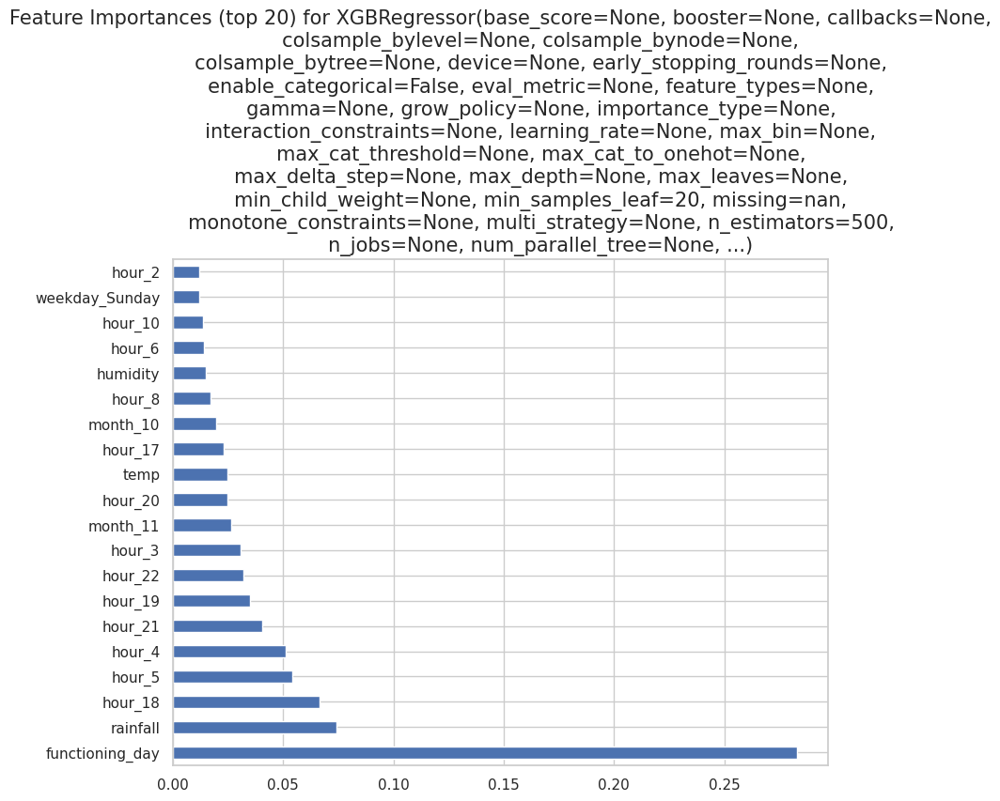

In [337]:

# Evaluation matrices for XGBRegressor
result = evaluate_model(xgb_model, y_test,y_pred_xgb)
score['Extreme Gradient Boosting Regressor Tuned'] = result

##### Which hyperparameter optimization technique have you used and why?


Randomized search cross-validation (CV) is used to efficiently explore the hyperparameter space of a machine learning model. It works by randomly sampling from the search space of hyperparameters, rather than exhaustively trying every possible combination. This allows for a more efficient search while still providing a good chance of finding good hyperparameter values. Additionally, by using cross-validation to evaluate the performance of each set of hyperparameters, one can ensure that the model is not overfitting to the training data.

Because of its randomly sampling technique and to save the time i have decided to use Randomized search CV.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.


In [338]:

score

,Linear regression,Linear regression tuned,Lasso regression,Lasso with alpha = 0.001,Ridge,Ridge with alpha = 5,Decision tree,Decision tree tuned,Random forest,Random forest tuned,Gradient Boosting Regressor,Gradient Boosting Regressor Tuned,Extreme Gradient Boosting Regressor,Extreme Gradient Boosting Regressor Tuned
MSE,88104.469446,88293.284719,199251.391316,88412.185994,88366.244942,88416.540826,69443.330479,90340.444168,38426.740224,75777.158640,80141.721914,26479.911303,29852.700136,26263.730019
RMSE,296.823970,297.141860,446.375841,297.341867,297.264604,297.349190,263.521025,300.566871,196.027397,275.276513,283.093133,162.726492,172.779339,162.060884
MAE,201.599968,201.649794,303.758508,201.725809,201.691582,201.757434,149.094178,185.660750,111.419610,165.909806,188.687697,92.991445,100.262114,91.975649
Train R2,0.783960,0.783837,0.520123,0.783448,0.783548,0.783442,1.000000,0.836653,0.988056,0.856887,0.821719,0.996409,0.983873,0.999602
Test R2,0.789487,0.789036,0.523917,0.788752,0.788861,0.788741,0.834075,0.784144,0.908185,0.818941,0.808513,0.936730,0.928671,0.937247
Adjusted R2,0.782532,0.782066,0.508188,0.781772,0.781886,0.781762,0.828593,0.777013,0.905151,0.812959,0.802186,0.934640,0.926315,0.935173


After tuning the model i have got accuracy on train data arround 99 % and 93% on test data which is very good model accuracy, like Gradient Boosting Tuning data. But it is overfitting the model's training accuracy is almost 100%.

So, i would like to go with the model accuracy data of XGboost, before tuning. Which is 98% on train data and 92% on test data.

### Plot R2 scores for each model

In [339]:
score.columns

Index(['Linear regression', 'Linear regression tuned', 'Lasso regression',
       'Lasso with alpha = 0.001', 'Ridge', 'Ridge with alpha = 5',
       'Decision tree', 'Decision tree tuned', 'Random forest',
       'Random forest tuned', 'Gradient Boosting Regressor',
       'Gradient Boosting Regressor Tuned',
       'Extreme Gradient Boosting Regressor',
       'Extreme Gradient Boosting Regressor Tuned'],
      dtype='object')

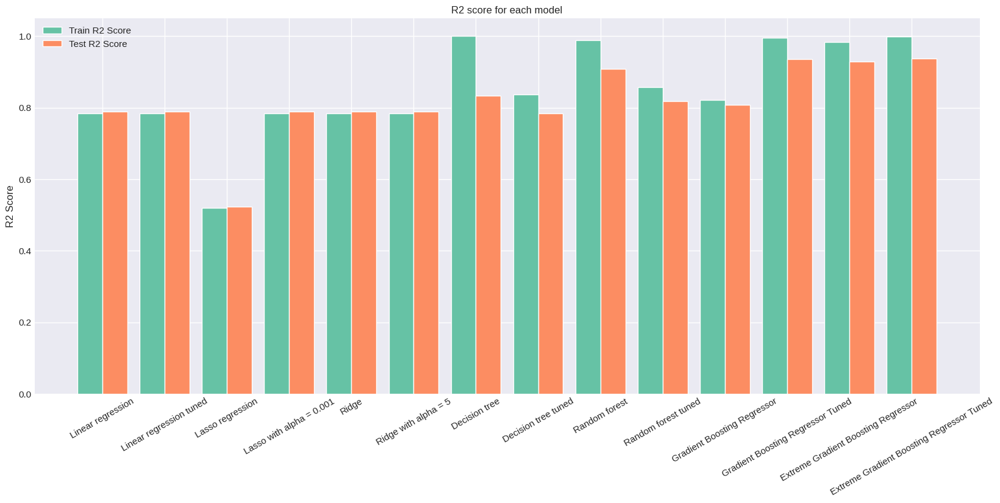

In [345]:
# R2 Scores plot

models = list(score.columns)
train = score.iloc[-3,:]
test = score.iloc[-2,:]

X_axis = np.arange(len(models))

train_colors = '#66c2a5'  # A soft green color for train scores
test_colors = '#fc8d62'   # A soft orange color for test scores

plt.figure(figsize=(20,8))
plt.bar(X_axis - 0.2, train, 0.4, label = 'Train R2 Score' , color=train_colors)
plt.bar(X_axis + 0.2, test, 0.4, label = 'Test R2 Score' , color=test_colors)


plt.xticks(X_axis,models, rotation=30)
plt.ylabel("R2 Score")
plt.title("R2 score for each model")
plt.legend()
plt.show()

### Plot of adjusted R2 score


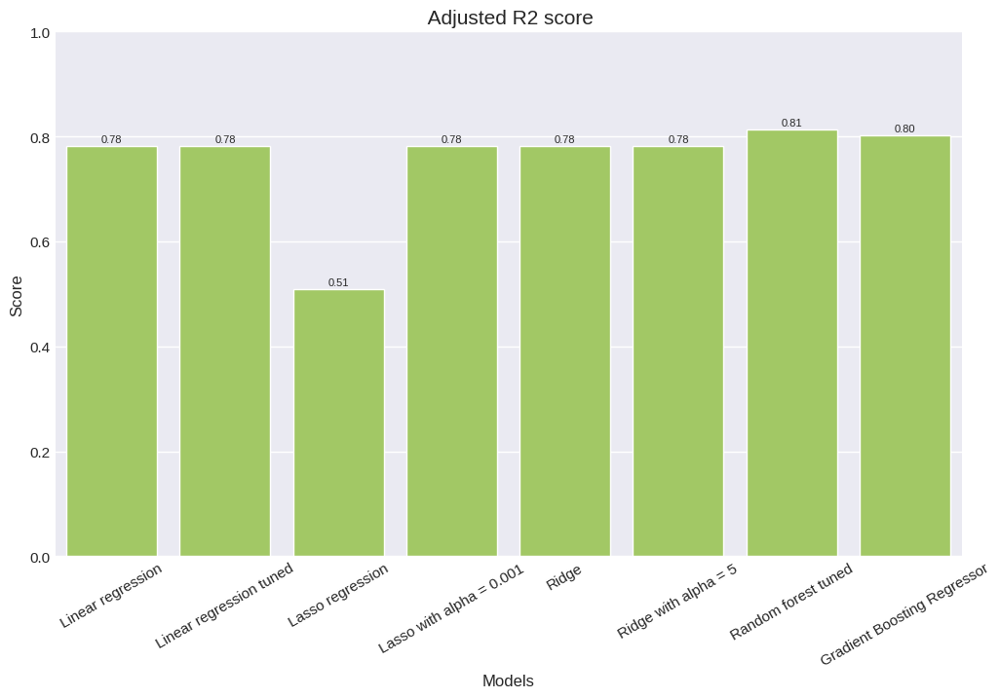

In [351]:
# Removing the overfitted models which have more than 5% gap between train and test values
score_t = score.transpose()            #taking transpose of the score dataframe to create new difference column
score_t['diff']=score_t['Train R2']-score_t['Test R2']                   #creating new column diff of train R2 and test R2 score
remove_models = list(score_t[score_t['diff']>=.05].index)                #creating a list of models which have difference more than .05 that is 5%
remove_models

adj = score_t['Adjusted R2'].drop(remove_models)                     #creating a new dataframe with required models and adjusted r2 score


# Visualizing a bar plot for adjusted R2 score
plt.figure(figsize=(12,7))
plots = sns.barplot(x=list(adj.index), y=adj, color='#a6d854')
for bar in plots.patches:
  plots.annotate(format(bar.get_height(),'.2f'),
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_height()), ha='center', va='center',
                   size=8, xytext=(0, 5),
                   textcoords='offset points')
plt.xticks(rotation=30)

plt.title(" Adjusted R2 score", fontsize = 15)
plt.xlabel('Models', fontsize = 12)
plt.ylabel('Score', fontsize = 12)

# Setting limit of the y axis from 0 to 30
plt.ylim(0,1)
plt.show()

### 1. Which Evaluation metrics did you consider for a positive business impact and why?

On the basis of all the model i have decided to select R2 score Evaluation matrics which shows the accuracy of the model which is very good indicator to check the feasibility of the model.

### 2. Which ML model did you choose from the above created models as your final prediction model and why?

I have ran a several models like linear regression, decision tree, random forest, gradient boosting, and xtreame gradient boosting but amongst them i have selected extreme gradient boosting regressor as i achieved 97% training accuracy and 92% testing accuracy. Some models were overfitted so i did not consider them.

### 3. Explain the model which you have used and the feature importance using any model explainability tool?

##### **SHAP(Shapley additive Explanations)**





In [357]:
pip install shap

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.1/540.1 kB 3.7 MB/s eta 0:00:00


In [358]:

# Importing shap
import shap


In [359]:

# Shap explainer for xgb model (tree based)
explainer = shap.TreeExplainer(xgb_model, X_train, feature_names=features)

In [360]:

# Plotting
shap.initjs()

# Select an instance from the test set
instance = X_test[50, :]

# Compute the SHAP values for the instance
shap_values = explainer(instance)

# Create the SHAP force plot
shap.plots.force(shap_values)

In [361]:
# Get shap values of test data
shap_values = explainer(X_test)

 99%|===================| 1726/1752 [00:52<00:00]       

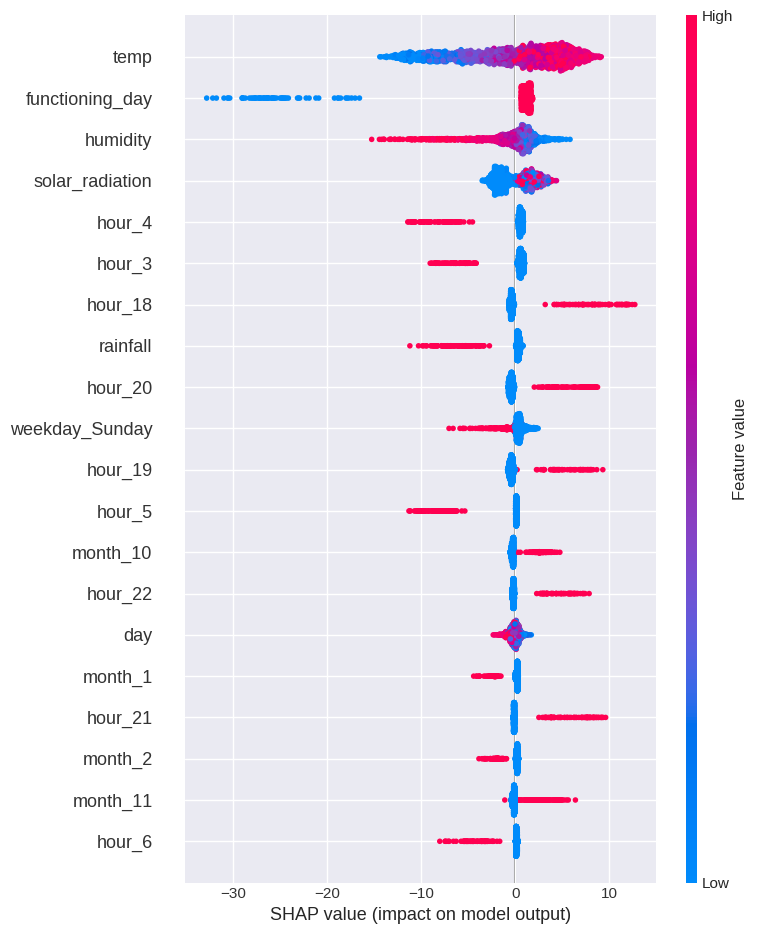

In [362]:

# Plotting the SHAP summary plot
shap.summary_plot(shap_values, X_test)

In the summary plot i can see the top 20 columns and their impact on the prediction. The red color indicates that the value of the columns is high and blue color shows that the value of the column is low.

For categorical columns, i have zeros and ones where zero is blue color and one is red color.

Shap values are also displayed and the impact on the prediction is also shown. Towards the right hand side, the impact is positive (increases the predicted value) and towards the left hand side, the impact is negative (decreases the predicted value).



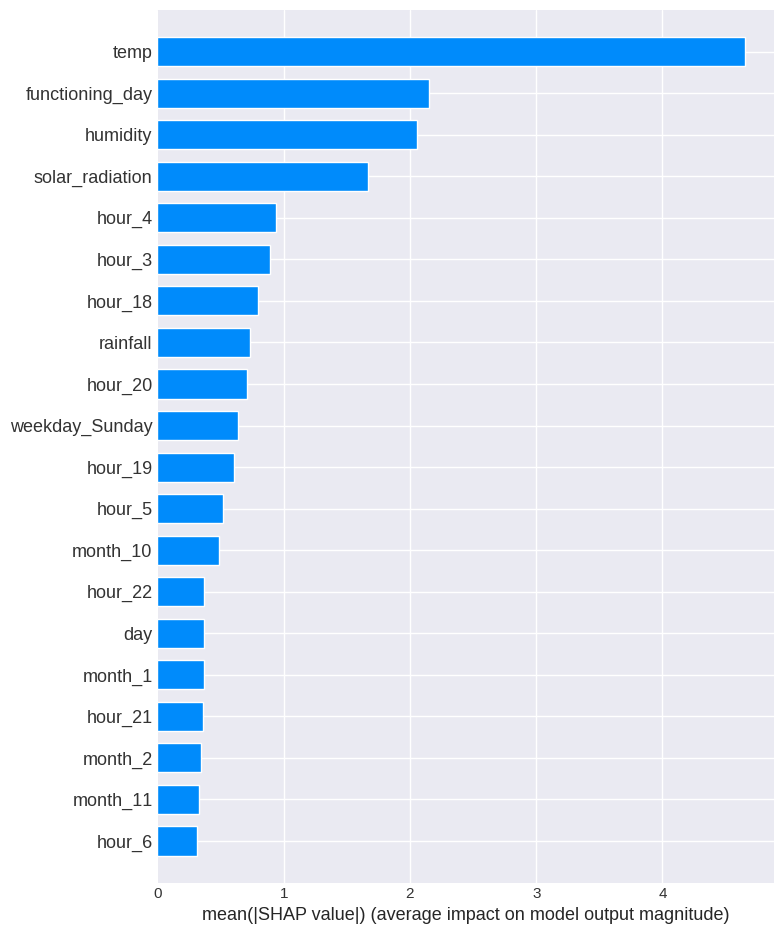

In [363]:

# Obtain a Bar Summary Plot
shap.summary_plot(shap_values, X_test, plot_type="bar")

This bar plot shows the top 20 important features and the mean shap values. It shows the average impact on the model output magnitude.

It does not show the positive or negative impact on the prediction.

## ***8.*** ***Future Work (Optional)***

### 1. Save the best performing ml model in a pickle file or joblib file format for deployment process.


In [364]:
# Save the File

import pickle
# Save the model to a pickle file
with open("xgb_model.pkl", "wb") as f:
  pickle.dump(xgb_model, f
              )

### 2. Again Load the saved model file and try to predict unseen data for a sanity check.


In [365]:
# Load the File and predict unseen data.
# Load the model from the pickle file
with open("xgb_model.pkl", "rb") as f:
    loaded_xgb_model = pickle.load(f)

new_test_preds = loaded_xgb_model.predict(X_test)

# Sanity Check
mse = mean_squared_error(y_test, new_test_preds)
mae = mean_absolute_error(y_test, new_test_preds)
r2 = r2_score(y_test, new_test_preds)
print("MSE:", mse)
print("MAE:", mae)
print("R2 Score:", r2)

MSE: 9.2833150928051
MAE: 1.9515794624905636
R2 Score: 0.941053173405818


### ***Congrats! Your model is successfully created and ready for deployment on a live server for a real user interaction !!!***

# **Conclusion**

The project successfully showcased how machine learning can be applied to predict bike demand in Seoul. Key observations include:

* Peak demand occurs in the morning and evening.
* Demand is lower during the winter season.
* June experiences the highest demand.
* There was multicollinearity detected between temperature and dew point temperature.

The project employed several models—linear regression, decision tree, random forest, gradient boosting, and extreme gradient boosting—achieving the best results with extreme gradient boosting, which reached an accuracy of 98% on the training data and 92% on the test data. Interestingly, removing outliers had a negative effect on model performance.

Overall, the project highlights the promise of machine learning for addressing real-world challenges and offers a foundation for further research, with potential for application in other cities with similar bike-sharing systems to improve operational efficiency and outcomes.

### ***Hurrah! You have successfully completed your Machine Learning Capstone Project !!!***